<center><img src = https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/hh%20label.jpg alt="drawing" style="width:400px;"></center>

# <center> Проект: Анализ резюме из HeadHunter
   

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import re

# Исследование структуры данных

### 1. Прочитайте данные с помощью библиотеки Pandas. 
Совет: перед чтением обратите внимание на разделитель внутри файла.

In [3]:
hh_data = pd.read_csv('./dst-3.0_16_1_hh_database.csv', sep=';') 

### 2. Выведите несколько первых (последних) строк таблицы, чтобы убедиться в том, что ваши данные не повреждены. Ознакомьтесь с признаками и их структурой.

In [4]:
display(hh_data.head())
display(hh_data.tail())

,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
0,"Мужчина , 39 лет , родился 27 ноября 1979",29000 руб.,Системный администратор,"Советск (Калининградская область) , не готов к...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, ва...",Опыт работы 16 лет 10 месяцев Август 2010 — п...,"МАОУ ""СОШ № 1 г.Немана""",Системный администратор,Неоконченное высшее образование 2000 Балтийск...,16.04.2019 15:59,Имеется собственный автомобиль
1,"Мужчина , 60 лет , родился 20 марта 1959",40000 руб.,Технический писатель,"Королев , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, уд...",Опыт работы 19 лет 5 месяцев Январь 2000 — по...,Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",Высшее образование 1981 Военно-космическая ак...,12.04.2019 08:42,Не указано
2,"Женщина , 36 лет , родилась 12 августа 1982",20000 руб.,Оператор,"Тверь , не готова к переезду , не готова к ком...",полная занятость,полный день,Опыт работы 10 лет 3 месяца Октябрь 2004 — Де...,ПАО Сбербанк,Кассир-операционист,Среднее специальное образование 2002 Профессио...,16.04.2019 08:35,Не указано
3,"Мужчина , 38 лет , родился 25 июня 1980",100000 руб.,Веб-разработчик (HTML / CSS / JS / PHP / базы ...,"Саратов , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, удаленная работа",Опыт работы 18 лет 9 месяцев Август 2017 — Ап...,OpenSoft,Инженер-программист,Высшее образование 2002 Саратовский государст...,08.04.2019 14:23,Не указано
4,"Женщина , 26 лет , родилась 3 марта 1993",140000 руб.,Региональный менеджер по продажам,"Москва , не готова к переезду , готова к коман...",полная занятость,полный день,Опыт работы 5 лет 7 месяцев Региональный мене...,Мармелад,Менеджер по продажам,Высшее образование 2015 Кгу Психологии и педаг...,22.04.2019 10:32,Не указано


,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
44739,"Мужчина , 30 лет , родился 17 января 1989",50000 руб.,"Финансист, аналитик, экономист, бухгалтер, мен...","Тверь , готов к переезду (Москва, Химки) , гот...",полная занятость,"полный день, удаленная работа","Опыт работы 7 лет 7 месяцев Финансист, аналит...","ООО ""IAS"" (независимый участник объединения Ru...",Руководитель субгруппы,Высшее образование 2015 Московский гуманитарн...,22.04.2019 12:32,Не указано
44740,"Мужчина , 27 лет , родился 5 марта 1992",39000 руб.,"Системный администратор, IT-специалист","Липецк , готов к переезду , готов к командировкам","проектная работа, частичная занятость, полная ...","удаленная работа, гибкий график, полный день, ...","Опыт работы 7 лет Системный администратор, IT...",ИП Пестрецов,Предприниматель,Высшее образование (Бакалавр) 2016 Воронежски...,22.04.2019 13:11,Не указано
44741,"Женщина , 48 лет , родилась 26 декабря 1970",40000 руб.,"Аналитик данных, Математик","Челябинск , готова к переезду , готова к редки...",полная занятость,"полный день, удаленная работа",Опыт работы 21 год 5 месяцев Январь 1998 — по...,"ОАО «ЧМК», Исследовательско-Технологический Це...",Начальник группы аналитики,Высшее образование 2000 Южно-Уральский госуда...,09.04.2019 05:07,Не указано
44742,"Мужчина , 24 года , родился 6 октября 1994",20000 руб.,Контент-менеджер,"Тамбов , не готов к переезду , не готов к кома...","частичная занятость, полная занятость",удаленная работа,Опыт работы 3 года 10 месяцев Контент-менедже...,IQ-Maxima,Менеджер проектов,Высшее образование 2015 Тамбовский государств...,26.04.2019 14:25,Имеется собственный автомобиль
44743,"Мужчина , 38 лет , родился 25 апреля 1980",120000 руб.,Руководитель проекта,"Москва , не готов к переезду , не готов к кома...",полная занятость,полный день,Опыт работы 15 лет 10 месяцев Руководитель пр...,ПАО ГК ТНС энерго,Руководитель отдела технической поддержки,Высшее образование 1997 Южно-Российский госуд...,05.07.2018 20:15,Не указано


### 3. Выведите основную информацию о числе непустых значений в столбцах и их типах в таблице.

### 4. Обратите внимание на информацию о числе непустых значений.

In [5]:
display(hh_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44744 entries, 0 to 44743
Data columns (total 12 columns):
 #   Column                           Non-Null Count  Dtype 
---  ------                           --------------  ----- 
 0   Пол, возраст                     44744 non-null  object
 1   ЗП                               44744 non-null  object
 2   Ищет работу на должность:        44744 non-null  object
 3   Город, переезд, командировки     44744 non-null  object
 4   Занятость                        44744 non-null  object
 5   График                           44744 non-null  object
 6   Опыт работы                      44576 non-null  object
 7   Последнее/нынешнее место работы  44743 non-null  object
 8   Последняя/нынешняя должность     44742 non-null  object
 9   Образование и ВУЗ                44744 non-null  object
 10  Обновление резюме                44744 non-null  object
 11  Авто                             44744 non-null  object
dtypes: object(12)
memory usage: 4.1+

None

### 5. Выведите основную статистическую информацию о столбцах.

In [6]:
display(hh_data.describe(include=['object']))

,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
count,44744,44744,44744,44744,44744,44744,44576,44743,44742,44744,44744,44744
unique,16003,690,14929,10063,38,47,44413,30214,16927,40148,18838,2
top,"Мужчина , 32 года , родился 17 сентября 1986",50000 руб.,Системный администратор,"Москва , не готов к переезду , не готов к кома...",полная занятость,полный день,Опыт работы 10 лет 8 месяцев Апрель 2018 — по...,Индивидуальное предпринимательство / частная п...,Системный администратор,Высшее образование 1987 Военный инженерный Кра...,07.05.2019 09:50,Не указано
freq,18,4064,3099,1261,30026,22727,3,935,2062,4,25,32268


# Преобразование данных

### 1. Начнем с простого - с признака ***"Образование и ВУЗ"***. Его текущий формат это: ***<Уровень образования год выпуска ВУЗ специальность...>***.  Например:
* Высшее образование 2016 Московский авиационный институт (национальный исследовательский университет)...
* Неоконченное высшее образование 2000  Балтийская государственная академия рыбопромыслового флота…
Нас будет интересовать только уровень образования.

Создайте с помощью функции-преобразования новый признак **"Образование"**, который должен иметь 4 категории: "высшее", "неоконченное высшее", "среднее специальное" и "среднее".

Выполните преобразование, ответьте на контрольные вопросы и удалите признак "Образование и ВУЗ".

Совет: обратите внимание на структуру текста в столбце **"Образование и ВУЗ"**. Гарантируется, что текущий уровень образования соискателя всегда находится в первых 2ух слов и начинается с заглавной буквы. Воспользуйтесь этим.

*Совет: проверяйте полученные категории, например, с помощью метода unique()*


In [7]:
# Создадим функцию для отнесения уровня образования к заданным
def get_education(education):
    """Функция преобразования уровня образования в 4 категории "высшее", 
    "неоконченное высшее", "среднее специальное" и "среднее"

    Args:
        education (string): строка содержащая сведенья об уровне образования

    Returns:
        (string): уровень образования соответствующей одной из 4 категорий
    """
    education = education.lower()
    education_ls = education.split(' ')
    if education_ls[0] == 'высшее':
        return 'высшее'
    elif education_ls[0] == 'неоконченное':
        return 'неоконченное высшее'
    elif education_ls[1] == 'специальное':
        return 'среднее специальное'
    elif education_ls[0] == 'среднее':
        return 'среднее'

# Добавим признак "Образование" и проверим количество уникальных категорий
hh_data_copy = hh_data.copy()
hh_data_copy['Образование'] = hh_data_copy['Образование и ВУЗ'].apply(get_education)
print(f"Количество уникальных значений в признаке 'Образование': {hh_data_copy['Образование'].nunique()}")
# Удалим старый признак "Образование и ВУЗ"
hh_data_copy = hh_data_copy.drop(['Образование и ВУЗ'], axis=1)

# Проверим отсутствие пропусков в новом признаке
print(f'Количество пропусков в признаке "Образование": {hh_data_copy["Образование"].isnull().sum()}')

#Задание 3.1
#Сколько соискателей имеет средний уровень образования (школьное образование)?
print(f"Количество соискателей со средним уровнем образования: {hh_data_copy['Образование'].value_counts().loc['среднее']}")


Количество уникальных значений в признаке 'Образование': 4
Количество пропусков в признаке "Образование": 0
Количество соискателей со средним уровнем образования: 559


### 2. Теперь нас интересует столбец **"Пол, возраст"**.  
Сейчас он представлен в формате **<Пол , возраст , дата рождения >**. Например:
* Мужчина , 39 лет , родился 27 ноября 1979 
* Женщина , 21 год , родилась 13 января 2000
Как вы понимаете, нам необходимо выделить каждый параметр в отдельный столбец.

Создайте два новых признака **"Пол"** и **"Возраст"**. При этом важно учесть:
* Признак пола должен иметь 2 уникальных строковых значения: 'М' - мужчина, 'Ж' - женщина. 
* Признак возраста должен быть представлен целыми числами.

Выполните преобразование, ответьте на контрольные вопросы и удалите признак **"Пол, возраст"** из таблицы.

*Совет: обратите внимание на структуру текста в столбце, в части на то, как разделены параметры пола, возраста и даты рождения между собой - символом ' , '. 
Гарантируется, что структура одинакова для всех строк в таблице. Вы можете воспользоваться этим.*


In [8]:
# Создадим новые признаки "Пол" и "Возраст" с помощью lambda функций
hh_data_copy['Пол'] = hh_data_copy['Пол, возраст'].apply(lambda x: x.split(',')[0][0])
hh_data_copy['Возраст'] = hh_data_copy['Пол, возраст'].apply(lambda x: int(x.split(',')[1][0:5]))

# Удалим старый признак "Пол, возраст"
hh_data_copy = hh_data_copy.drop(['Пол, возраст'], axis=1)


#Задание 3.2
#Сколько процентов женских резюме представлено в наших данных? Ответ округлите до сотых.
print(f"Резюме соискателей женского пола составляют: {round(hh_data_copy['Пол'].value_counts(normalize=True)[1]*100, 2)}%")

#Чему равен средний возраст соискателей? Ответ округлите до десятых.
print(f"Средний возраст соискателей составляет: {round(hh_data_copy['Возраст'].mean(), 1)} года")

Резюме соискателей женского пола составляют: 19.07%
Средний возраст соискателей составляет: 32.2 года


### 3. Следующим этапом преобразуем признак **"Опыт работы"**. Его текущий формат - это: **<Опыт работы: n лет m месяцев, периоды работы в различных компаниях…>**. 

Из столбца нам необходимо выделить общий опыт работы соискателя в месяцах, новый признак назовем "Опыт работы (месяц)"

Для начала обсудим условия решения задачи:
* Во-первых, в данном признаке есть пропуски. Условимся, что если мы встречаем пропуск, оставляем его как есть (функция-преобразование возвращает NaN)
* Во-вторых, в данном признаке есть скрытые пропуски. Для некоторых соискателей в столбце стоит значения "Не указано". Их тоже обозначим как NaN (функция-преобразование возвращает NaN)
* В-третьих, нас не интересует информация, которая описывается после указания опыта работы (периоды работы в различных компаниях)
* В-четвертых, у нас есть проблема: опыт работы может быть представлен только в годах или только месяцах. Например, можно встретить следующие варианты:
    * Опыт работы 3 года 2 месяца…
    * Опыт работы 4 года…
    * Опыт работы 11 месяцев…
    * Учитывайте эту особенность в вашем коде

Учитывайте эту особенность в вашем коде

В результате преобразования у вас должен получиться столбец, содержащий информацию о том, сколько месяцев проработал соискатель.
Выполните преобразование, ответьте на контрольные вопросы и удалите столбец **"Опыт работы"** из таблицы.


In [9]:
# Создадим функцию извлечения опыта работы в месяцах
def get_experience(str):
    """Функция выделяет из строки данные об опыте работы и приводит их в месяцах

    Args:
        str (string): строка с опытом работы

    Returns:
        (int): опытом работы в месяцах
    """
    year_ls = ['лет', 'года', 'год']
    month_ls = ['месяц','месяца', 'месяцев']
    year = 0
    month = 0
    if str == "Не указано" or str is np.nan: # Проверка на отсутствие данных
        return np.nan
    else:
        str = str.split(' ')        
        for num in range(6):        
            if str[num] in year_ls:
                year = int(str[num-1])
            elif str[num] in month_ls:
                month = int(str[num-1])
            else:
                continue
    return year*12 + month

# Создадим признак 'Опыт работы (месяц)' и удалим старый признак 
hh_data_copy['Опыт работы (месяц)'] = hh_data_copy['Опыт работы'].apply(get_experience)
hh_data_copy = hh_data_copy.drop(['Опыт работы'], axis=1)

#Задание 3.3
#Чему равен медианный опыт работы (в месяцах) в нашей таблице?
print(f"Медианное значение опыта работы: {hh_data_copy['Опыт работы (месяц)'].median()} месяцев")

Медианное значение опыта работы: 100.0 месяцев


### 4. Хорошо идем! Следующий на очереди признак "Город, переезд, командировки". 
Информация в нем представлена в следующем виде: **<Город , (метро) , готовность к переезду (города для переезда) , готовность к командировкам>**. В скобках указаны необязательные параметры строки. Например, можно встретить следующие варианты:

* Москва , не готов к переезду , готов к командировкам
* Москва , м. Беломорская , не готов к переезду, не готов к командировкам
* Воронеж , готов к переезду (Сочи, Москва, Санкт-Петербург) , готов к командировкам

Создадим отдельные признаки **"Город"**, **"Готовность к переезду"**, **"Готовность к командировкам"**. При этом важно учесть:

* Признак **"Город"** должен содержать только 4 категории: "Москва", "Санкт-Петербург" и "город-миллионник" (их список ниже), остальные обозначьте как "другие".

    Список городов-миллионников:
    
   <code>million_cities = ['Новосибирск', 'Екатеринбург','Нижний Новгород','Казань', 'Челябинск','Омск', 'Самара', 'Ростов-на-Дону', 'Уфа', 'Красноярск', 'Пермь', 'Воронеж','Волгоград']
    </code>
    Инфорация о метро, рядом с которым проживает соискатель нас не интересует.
* Признак **"Готовность к переезду"** должен иметь два возможных варианта: True или False. Обратите внимание, что возможны несколько вариантов описания готовности к переезду в признаке "Город, переезд, командировки". Например:
    * … , готов к переезду , …
    * … , не готова к переезду , …
    * … , готова к переезду (Москва, Санкт-Петербург, Ростов-на-Дону)
    * … , хочу переехать (США) , …
    
    Нас интересует только сам факт возможности или желания переезда.
* Признак **"Готовность к командировкам"** должен иметь два возможных варианта: True или False. Обратите внимание, что возможны несколько вариантов описания готовности к командировкам в признаке "Город, переезд, командировки". Например:
    * … , готов к командировкам , … 
    * … , готова к редким командировкам , …
    * … , не готов к командировкам , …
    
    Нас интересует только сам факт готовности к командировке.
    
    Еще один важный факт: при выгрузки данных у некоторых соискателей "потерялась" информация о готовности к командировкам. Давайте по умолчанию будем считать, что такие соискатели не готовы к командировкам.
    
Выполните преобразования и удалите столбец **"Город, переезд, командировки"** из таблицы.

*Совет: обратите внимание на то, что структура текста может меняться в зависимости от указания ближайшего метро. Учите это, если будете использовать порядок слов в своей программе.*


In [10]:
# Создадим функцию для определения города проживания соискателя
def get_city(str):
    """Функция выделяет из строки город и соотносит его с одной из 4 категорий: 
    "Москва", "Санкт-Петербург", "город-миллионник" и "другие"

    Args:
        str (string): строка, содержащая наименование города

    Returns:
        (string): строка с одной из 4 категорий:
        "Москва", "Санкт-Петербург", "город-миллионник" и "другие"
    """
    million_cities = [
        'Новосибирск', 'Екатеринбург','Нижний Новгород',
        'Казань', 'Челябинск','Омск', 'Самара', 'Ростов-на-Дону',
        'Уфа', 'Красноярск', 'Пермь', 'Воронеж','Волгоград'
        ]
    str = str.split(' ')
    if str[0] == 'Москва':
        return 'Москва'
    elif str[0] == 'Санкт-Петербург':
        return 'Санкт-Петербург'
    elif str[0] in million_cities:
        return 'город-миллионник'
    else:
        return 'другие'

# Создадим функцию для определения готовности к переезду
def get_trip(str):
    """Функция извлекает из входной строки информацию о готовности к переезду 
    по совпадающим ключевым словам

    Args:
        str (string): строка, содержащая сведенья о готовности к переезду

    Returns:
        (bool): True - соискатель готов к переезду, False - не готов
    """
    str = str.split(',')
    for x in str:
        if re.findall(r'ерее', x) == ['ерее']:
            if ('готов' in x or 'хочу' in x) and ('не готов' not in x):
                return True
            else:
                return False
   
         
# Создадим функцию для определения готовности к командировкам
def get_business_trip(str):
    """Функция извлекает из входной строки информацию о готовности к командировкам 
    по совпадающим ключевым словам
    Args:
        str (string): строка, содержащая сведенья о готовности к командировкам

    Returns:
        (bool): True - соискатель готов к командировкам, False - не готов
    """
    if 'командировка' in str:
        if (re.findall(r'не готов к командировкам', str) == ['не готов к командировкам']) \
        or (re.findall(r'не готова к командировкам', str) == ['не готова к командировкам']):
            return False
        else:
            return True
    else:
        return False
    
# Создаем новые признаки и проверяем результат
hh_data_copy['Город'] = hh_data_copy['Город, переезд, командировки'].apply(get_city)
display(hh_data_copy['Город'].value_counts())
hh_data_copy['Готовность к переезду'] = hh_data_copy['Город, переезд, командировки'].apply(get_trip)
display(hh_data_copy['Готовность к переезду'].value_counts())
hh_data_copy['Готовность к командировкам'] = hh_data_copy['Город, переезд, командировки'].apply(get_business_trip)
display(hh_data_copy['Готовность к командировкам'].value_counts())

# Удаляем старый признак
hh_data_copy = hh_data_copy.drop(['Город, переезд, командировки'], axis=1)

# Задание 3.4
# Сколько процентов соискателей живут в Санкт-Петербурге? Ответ округлите до целого.
x = round(hh_data_copy['Город'].value_counts(normalize=True)*100)['Санкт-Петербург']
print(f"В Санкт-Петербурге проживает {x}% соискателей")
      
# Сколько процентов соискателей готовы одновременно и к переездам, и к командировкам? Ответ округлите до целого.
mask = (hh_data_copy['Готовность к командировкам']) & (hh_data_copy['Готовность к переезду'])
x = round(hh_data_copy[mask]['Готовность к командировкам'].count() / hh_data_copy.shape[0]*100)
print(f"К переезду и командировкам готово {x}% соискателей")



Москва              16621
другие              16452
город-миллионник     6734
Санкт-Петербург      4937
Name: Город, dtype: int64

False    28719
True     16025
Name: Готовность к переезду, dtype: int64

True     31640
False    13104
Name: Готовность к командировкам, dtype: int64

В Санкт-Петербурге проживает 11.0% соискателей
К переезду и командировкам готово 32% соискателей


### 5. Рассмотрим поближе признаки **"Занятость"** и **"График"**. Сейчас признаки представляют собой набор категорий желаемой занятости (полная занятость, частичная занятость, проектная работа, волонтерство, стажировка) и желаемого графика работы (полный день, сменный график, гибкий график, удаленная работа, вахтовый метод).
На сайте hh.ru соискатель может указывать различные комбинации данных категорий, например:
* полная занятость, частичная занятость
* частичная занятость, проектная работа, волонтерство
* полный день, удаленная работа
* вахтовый метод, гибкий график, удаленная работа, полная занятость

Такой вариант признаков имеет множество различных комбинаций, а значит множество уникальных значений, что мешает анализу. Нужно это исправить!

Давайте создадим признаки-мигалки для каждой категории: если категория присутствует в списке желаемых соискателем, то в столбце на месте строки рассматриваемого соискателя ставится True, иначе - False.

Такой метод преобразования категориальных признаков называется One Hot Encoding и его схема представлена на рисунке ниже:
<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/ohe.jpg>     
Выполните данное преобразование для признаков "Занятость" и "График", ответьте на контрольные вопросы, после чего удалите их из таблицы

In [11]:
# Создаем новые признаки с использованием lambda функций

hh_data_copy['полная занятость'] = hh_data_copy['Занятость'].apply(lambda x: True if 'полная занятость' in x else False)
hh_data_copy['частичная занятость'] = hh_data_copy['Занятость'].apply(lambda x: True if 'частичная занятость' in x else False)
hh_data_copy['проектная работа'] = hh_data_copy['Занятость'].apply(lambda x: True if 'проектная работа' in x else False)
hh_data_copy['волонтерство'] = hh_data_copy['Занятость'].apply(lambda x: True if 'волонтерство' in x else False)
hh_data_copy['стажировка'] = hh_data_copy['Занятость'].apply(lambda x: True if 'стажировка' in x else False)

hh_data_copy['полный день'] = hh_data_copy['График'].apply(lambda x: True if 'полный день' in x else False)
hh_data_copy['сменный график'] = hh_data_copy['График'].apply(lambda x: True if 'сменный график' in x else False)
hh_data_copy['гибкий график'] = hh_data_copy['График'].apply(lambda x: True if 'гибкий график' in x else False)
hh_data_copy['удаленная работа'] = hh_data_copy['График'].apply(lambda x: True if 'удаленная работа' in x else False)
hh_data_copy['вахтовый метод'] = hh_data_copy['График'].apply(lambda x: True if 'вахтовый метод' in x else False)

# Удаляем старый признак
hh_data_copy = hh_data_copy.drop(['Занятость', 'График'], axis=1)

# Задание 3.5
# Сколько людей ищут проектную работу и волонтёрство (в обоих столбцах стоит True)?
mask1 = (hh_data_copy['проектная работа'] == True) & (hh_data_copy['волонтерство'] == True)
print(f'Количество соискателей ищущих проектную работу и волонтёрство: {hh_data_copy[mask1].shape[0]} человек')

# Сколько людей хотят работать вахтовым методом и с гибким графиком (в обоих столбцах стоит True)?
mask2 = (hh_data_copy['вахтовый метод'] == True) & (hh_data_copy['гибкий график'] == True)
print(f'Количество соискателей, которые хотят работать вахтовым методом и с гибким графиком: {hh_data_copy[mask2].shape[0]} человек')

Количество соискателей ищущих проектную работу и волонтёрство: 436 человек
Количество соискателей, которые хотят работать вахтовым методом и с гибким графиком: 2311 человек


### 6. (2 балла) Наконец, мы добрались до самого главного и самого важного - признака заработной платы **"ЗП"**. 
В чем наша беда? В том, что помимо желаемой заработной платы соискатель указывает валюту, в которой он бы хотел ее получать, например:
* 30000 руб.
* 50000 грн.
* 550 USD

Нам бы хотелось видеть заработную плату в единой валюте, например, в рублях. Возникает вопрос, а где взять курс валют по отношению к рублю?

На самом деле язык Python имеет в арсенале огромное количество возможностей получения данной информации, от обращения к API Центробанка, до использования специальных библиотек, например pycbrf. Однако, это не тема нашего проекта.

Поэтому мы пойдем в лоб: обратимся к специальным интернет-ресурсам для получения данных о курсе в виде текстовых файлов. Например, MDF.RU, данный ресурс позволяет удобно экспортировать данные о курсах различных валют и акций за указанные периоды в виде csv файлов. Мы уже сделали выгрузку курсов валют, которые встречаются в наших данных за период с 29.12.2017 по 05.12.2019. Скачать ее вы можете **на платформе**

Создайте новый DataFrame из полученного файла. В полученной таблице нас будут интересовать столбцы:
* "currency" - наименование валюты в ISO кодировке,
* "date" - дата, 
* "proportion" - пропорция, 
* "close" - цена закрытия (последний зафиксированный курс валюты на указанный день).


Перед вами таблица соответствия наименований иностранных валют в наших данных и их общепринятых сокращений, которые представлены в нашем файле с курсами валют. Пропорция - это число, за сколько единиц валюты указан курс в таблице с курсами. Например, для казахстанского тенге курс на 20.08.2019 составляет 17.197 руб. за 100 тенге, тогда итоговый курс равен - 17.197 / 100 = 0.17197 руб за 1 тенге.
Воспользуйтесь этой информацией в ваших преобразованиях.

<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/table.jpg>


Осталось только понять, откуда брать дату, по которой определяется курс? А вот же она - в признаке **"Обновление резюме"**, в нем содержится дата и время, когда соискатель выложил текущий вариант своего резюме. Нас интересует только дата, по ней бы и будем сопоставлять курсы валют.

Теперь у нас есть вся необходимая информация для того, чтобы создать признак "ЗП (руб)" - заработная плата в рублях.

После ответа на контрольные вопросы удалите исходный столбец заработной платы "ЗП" и все промежуточные столбцы, если вы их создавали.

Итак, давайте обсудим возможный алгоритм преобразования: 
1. Перевести признак "Обновление резюме" из таблицы с резюме в формат datetime и достать из него дату. В тот же формат привести признак "date" из таблицы с валютами.
2. Выделить из столбца "ЗП" сумму желаемой заработной платы и наименование валюты, в которой она исчисляется. Наименование валюты перевести в стандарт ISO согласно с таблицей выше.
3. Присоединить к таблице с резюме таблицу с курсами по столбцам с датой и названием валюты (подумайте, какой тип объединения надо выбрать, чтобы в таблице с резюме сохранились данные о заработной плате, изначально представленной в рублях). Значение close для рубля заполнить единицей 1 (курс рубля самого к себе)
4. Умножить сумму желаемой заработной платы на присоединенный курс валюты (close) и разделить на пропорцию (обратите внимание на пропуски после объединения в этих столбцах), результат занести в новый столбец "ЗП (руб)".


In [12]:
# Преобразуем дату в формат datetime и извлекаем дату
hh_data_copy['Обновление резюме'] = pd.to_datetime(hh_data_copy['Обновление резюме'], dayfirst=True)
hh_data_copy['Обновление резюме'] = hh_data_copy['Обновление резюме'].dt.date

# Считываем таблицу с валютами и преобразуем дату в формат datetime
rates_df = pd.read_csv(
    'https://github.com/Tio147/DS_1/raw/main/project_1/ExchangeRates.zip',
    compression='zip',
    usecols=[
        "currency",
        "date",
        "proportion",
        "close"
        ]
    )
rates_df['date'] = pd.to_datetime(rates_df['date'], dayfirst=True)

# Создаем новые признаки с суммой желаемой зарплаты в числовом формате и наименование валюты
hh_data_copy['currency'] = hh_data_copy['ЗП'].apply(lambda x: x.split()[1])
hh_data_copy['sum'] = hh_data_copy['ЗП'].apply(lambda x: x.split()[0])
hh_data_copy['sum'] = hh_data_copy['sum'].astype('float')

# Наименование валюты переводим в стандарт ISO
cur_dict ={
    'руб.':'RUB',
    'грн.':'UAH',
    'USD':'USD',
    'EUR':'EUR',
    'бел.руб.':'BYN',
    'KGS':'KGS',
    'сум':'UZS',
    'AZN':'AZN',
    'KZT':'KZT'
    }
hh_data_copy['currency'] = hh_data_copy['currency'].apply(lambda x: cur_dict[x])

# Объеденяем две таблицы по признаку валюты и дате
hh_df = hh_data_copy.copy()
hh_df['Обновление резюме'] = pd.to_datetime(hh_df['Обновление резюме'])
hh_df = hh_df.merge(
    rates_df,
    left_on=['currency', 'Обновление резюме'],
    right_on=['currency', 'date'],
    how='left'
    )

# Заполним отсутствующие значения close и proportion единицей для рубля
hh_df['close'] = hh_df['close'].fillna(1)
hh_df['proportion'] = hh_df['proportion'].fillna(1)

# Создадим новый признак, содержащий желаемую зарплату в рублях
hh_df['ЗП (руб)'] = (hh_df['sum'] * hh_df['close']) / hh_df['proportion']

# Удалим вспомагательные признаки
hh_df = hh_df.drop(['ЗП','currency', 'sum', 'date', 'close', 'proportion'], axis=1)

# Задание 3.6
#Чему равна желаемая медианная заработная плата соискателей в нашей таблице (в рублях)?
#Ответ приведите в тысячах рублей и округлите до целого. 
# Например, если у вас получилась медианная з/п 42 127, в качестве ответа укажите 42.
x = round(hh_df['ЗП (руб)'].median() / 1000)
print(f"Медианное значение заработной платы составляет {x} тысяч рублей.")

Медианное значение заработной платы составляет 59 тысяч рублей.


# Исследование зависимостей в данных

### 1. Постройте распределение признака **"Возраст"**. 
Опишите распределение, отвечая на следующие вопросы: чему равна мода распределения, каковы предельные значения признака, в каком примерном интервале находится возраст большинства соискателей? Есть ли аномалии для признака возраста, какие значения вы бы причислили к их числу?
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*

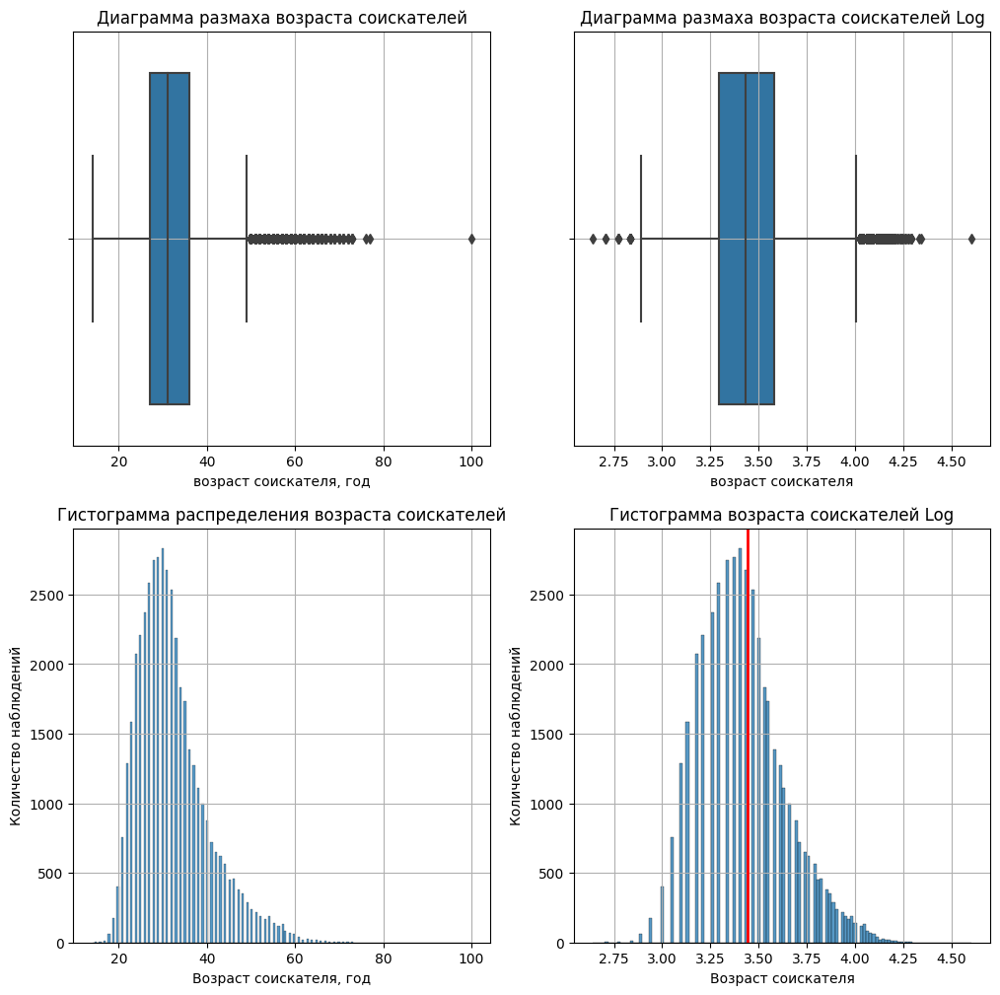

Показатель ассиметрии: 0.45


In [13]:
# Создаем гистограмму
fig = px.histogram(
    data_frame=hh_df,
    x='Возраст',   
    marginal='box',
    width=800,
    height=500,
    )

# Настраиваем отображение
fig.update_layout(
    title='Распределение возраста соискателей',
    title_x = 0.5,
    xaxis_title='Возраст соискателей, год',
    yaxis_title='Число наблюдений'
    )

fig.show()

# Создаем гистограмму для пролагорифмированного распределения возраста соискателей
fig = px.histogram(
    data_frame=hh_df,
    x=np.log(hh_df['Возраст']),   
    marginal='box',
    width=800,
    height=500,
    )
# Строим линию среднего значения для определения ассиметрии распределения
fig.add_shape(
    type='line',
    line_color='red',
    line_width=3,
    opacity=1,
    line_dash='solid',
    x0=np.log(hh_df['Возраст']).mean(),
    x1=np.log(hh_df['Возраст']).mean(),
    xref='x',
    y0=0,
    y1=3000,
    yref='y'
    )

# Настраиваем отображение
fig.update_layout(
    title='Распределение возраста соискателей Log',
    title_x = 0.5,
    xaxis_title='Возраст соискателей',
    yaxis_title='Число наблюдений'
    )
    
fig.show()

#Построение графиков в seaborn для корректного отображения на GitHub
# Создаем диаграмму размаха для признака возраст
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
bx = sns.boxplot(
    data=hh_df,
    x='Возраст',   
    orient='h',
    ax=axes[0][0]
    )

# Повышаем информативность
bx.set_title('Диаграмма размаха возраста соискателей')
bx.set_xlabel('возраст соискателя, год')
bx.grid()

# Создаем гистограмму для признака возраст
hist = sns.histplot(
    data=hh_df,
    x='Возраст',
    ax=axes[1][0])

# Повышаем информативность
hist.set_title('Гистограмма распределения возраста соискателей')
hist.set_xlabel('Возраст соискателя, год') 
hist.set_ylabel('Количество наблюдений')
hist.grid()

# Создаем диаграмму размаха для пролагорифмированного распределения
bx = sns.boxplot(
    data=hh_df,
    x=np.log(hh_df['Возраст']),   
    orient='h',
    ax=axes[0][1]
    )

# Повышаем информативность
bx.set_title('Диаграмма размаха возраста соискателей Log')
bx.set_xlabel('возраст соискателя')
bx.grid()

# Создаем гистограмму для пролагорифмированного распределения
hist = sns.histplot(
    data=hh_df, 
    x=np.log(hh_df['Возраст']),
    ax=axes[1][1])
# Строим линию среднего значения для определения ассиметрии распределения
hist.axvline(np.log(hh_df['Возраст']).mean(), color='r', lw='2')

# Повышаем информативность
hist.set_title('Гистограмма возраста соискателей Log')
hist.set_xlabel('Возраст соискателя') 
hist.set_ylabel('Количество наблюдений')
hist.grid()
plt.show()

# Вычислим численный показатель ассиметрии рапределения
print('Показатель ассиметрии:', round(np.log(hh_df['Возраст']).skew(), 2))

***Выводы по графику***

 Распределение напоминает логнормальное  - с наличием большого количества потенциальных выбросов справа, далеко отстоящих от основной массы наблюдений. Взяв натуральный логарифм от исходного рапределения и построив график получим рапределение близкое к нормальному с правой ассиметрией (справа от моды имеется чуть больше наблюдений чем слева). Показатель ассимаетрии As= 0,45 положительный, что подтверждает вывод о правой ассиметрии распределения. Мода распределения равна 30 годам, предельные значения распределения 14 и 100 лет. Возраст большей части соискателей находится в интервале от 22 до 36 лет. К аномалиям можно отнести возраст соискателя в 100 лет. Наличие большого числа потенциальных выбросов справа скорее говорит о малом числе соискателей почтенного возраста, чем об аномальности таких значений. 

Задание 4.1

Чему равно модальное значение возраста соискателей?         
Модальное значение возраста соискателей 30 лет.

Интерактивный график в формате HTML можно посмотреть [тут](https://htmlpreview.github.io/?https://github.com/DmitVasilev/Project_1-resume-analysis-on-HeadHunter/blob/master/image/1_1.html) и [тут](https://htmlpreview.github.io/?https://github.com/DmitVasilev/Project_1-resume-analysis-on-HeadHunter/blob/master/image/1_2.html).


### 2. Постройте распределение признака **"Опыт работы (месяц)"**. 
Опишите данное распределение, отвечая на следующие вопросы: чему равна мода распределения, каковы предельные значения признака, в каком примерном интервале находится опыт работы большинства соискателей? Есть ли аномалии для признака опыта работы, какие значения вы бы причислили к их числу?
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*

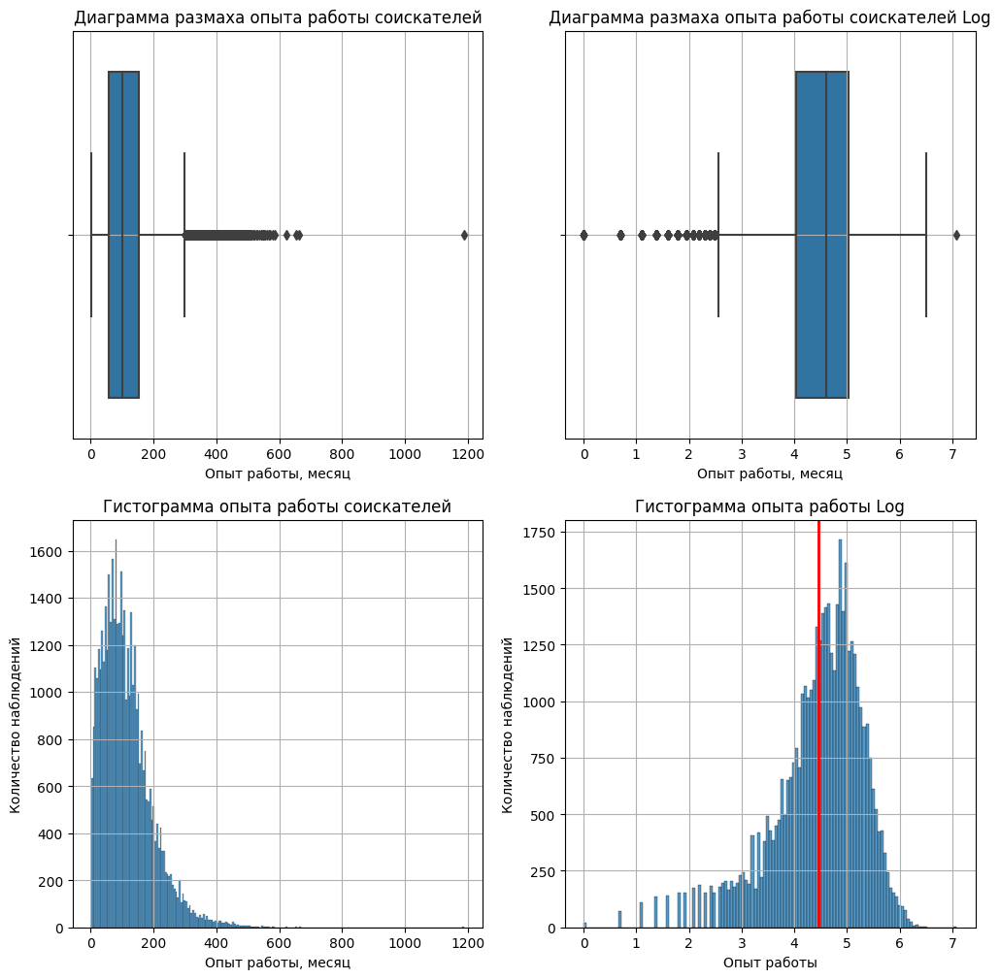

Показатель ассиметрии: -1.11
Модальное значение опыта работы: 81.0


In [14]:
# Создаем гистограмму
fig = px.histogram(
    data_frame=hh_df,
    x='Опыт работы (месяц)',
    marginal='box',
    width=800,
    height=500,
    )

# Настраиваем отображение
fig.update_layout(
    title='Распределение опыт работы соискателей в месяцах',
    title_x = 0.5,
    xaxis_title='Опыт работы, месяц',
    yaxis_title='Число наблюдений'
    )

fig.show()

# Создаем гистограмму для пролагорифмированного распределния
fig = px.histogram(
    data_frame=hh_df,
    x=np.log(hh_df['Опыт работы (месяц)']),   
    marginal='box',
    width=800,
    height=500,
    )
# Строим линию среднего значения для определения ассиметрии распределения
fig.add_shape(
    type='line',
    line_color='red',
    line_width=3,
    opacity=1,
    line_dash='solid',
    x0=np.log(hh_df['Опыт работы (месяц)']).mean(),
    x1=np.log(hh_df['Опыт работы (месяц)']).mean(),
    xref='x',
    y0=0,
    y1=3000,
    yref='y'
    )

# Настраиваем отображение
fig.update_layout(
    title='Распределение опыт работы соискателей в месяцах Log',
    title_x = 0.5,
    xaxis_title='Опыт работы',
    yaxis_title='Число наблюдений'
    )

fig.show()

#Построение графиков в seaborn для корректного отображения на GitHub
# Создаем диаграмму размаха
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
box = sns.boxplot(
    data=hh_df,
    x='Опыт работы (месяц)',   
    orient='h',
    ax=axes[0][0]
    )

# Повышаем информативность
box.set_title('Диаграмма размаха опыта работы соискателей')
box.set_xlabel('Опыт работы, месяц')
box.grid()

# Создаем гистограмму 
hist = sns.histplot(
    data=hh_df,
    x='Опыт работы (месяц)',
    ax=axes[1][0]
    )

# Повышаем информативность
hist.set_title('Гистограмма опыта работы соискателей')
hist.set_xlabel('Опыт работы, месяц') 
hist.set_ylabel('Количество наблюдений')
hist.grid()

# Создаем диаграмму размаха для пролагорифмированного распределения
box = sns.boxplot(
    data=hh_df,
    x=np.log(hh_df['Опыт работы (месяц)']),   
    orient='h',
    ax=axes[0][1]
    )

# Повышаем информативность
box.set_title('Диаграмма размаха опыта работы соискателей Log')
box.set_xlabel('Опыт работы, месяц')
box.grid()
 
# Создаем гистограмму для пролагорифмированного распределения
hist = sns.histplot(
    data=hh_df, 
    x=np.log(hh_df['Опыт работы (месяц)']),
    ax=axes[1][1]
    )

# Строим линию среднего значения для определения ассиметрии распределения
hist.axvline(np.log(hh_df['Опыт работы (месяц)']).mean(), color='r', lw='2')

# Повышаем информативность
hist.set_title('Гистограмма опыта работы Log')
hist.set_xlabel('Опыт работы') 
hist.set_ylabel('Количество наблюдений')
hist.grid()
plt.show()

# Вычислим численный показатель ассиметрии рапределения
print('Показатель ассиметрии:', round(np.log(hh_df['Опыт работы (месяц)']).skew(), 2))
# Вычислим модальное значение так как на графике оно показано интервалом от 80 до 84 месяцев
print('Модальное значение опыта работы:', hh_df['Опыт работы (месяц)'].mode()[0])

***Выводы по графику***

Распределение напоминает логнормальное. Построив график логарифма исходного рапределения что рапределение имеет сильную левую ассиметрию. Показатель ассимаетрии As= -1,11 отрицательный, что подтверждает вывод о левой ассиметрии распределения. Мода распределения равна 81 месяцу, предельные значения распределения от 1 и 1188 месяцев. Опыт работы большей части соискателей находится в интервале от 5 до 154 месяцев. К аномалии можно отнести опыт работы в 1188 месяцев (99 лет), на графике с возрастом соискателей предельным значением было 77 лет. Наличие большого числа потенциальных выбросов справа с опытом работы порядка 600 месяцев подтверждает наличие малого числа соискателей почтенного возраста, показанного на предыдущем графике.

Задание 4.2

Чему равен максимальный опыт работы (в месяцах)?
Максимальный опыт работы 1188  месяца.

Интерактивный график в формате HTML можно посмотреть [тут](https://htmlpreview.github.io/?https://github.com/DmitVasilev/Project_1-resume-analysis-on-HeadHunter/blob/master/image/2_1.html) и [тут](https://htmlpreview.github.io/?https://github.com/DmitVasilev/Project_1-resume-analysis-on-HeadHunter/blob/master/image/2_2.html).

### 3. Постройте распределение признака **"ЗП (руб)"**. 
Опишите данное распределение, отвечая на следующие вопросы: каковы предельные значения признака, в каком примерном интервале находится заработная плата большинства соискателей? Есть ли аномалии для признака заработной платы? Обратите внимание на гигантские размеры желаемой заработной платы.
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*


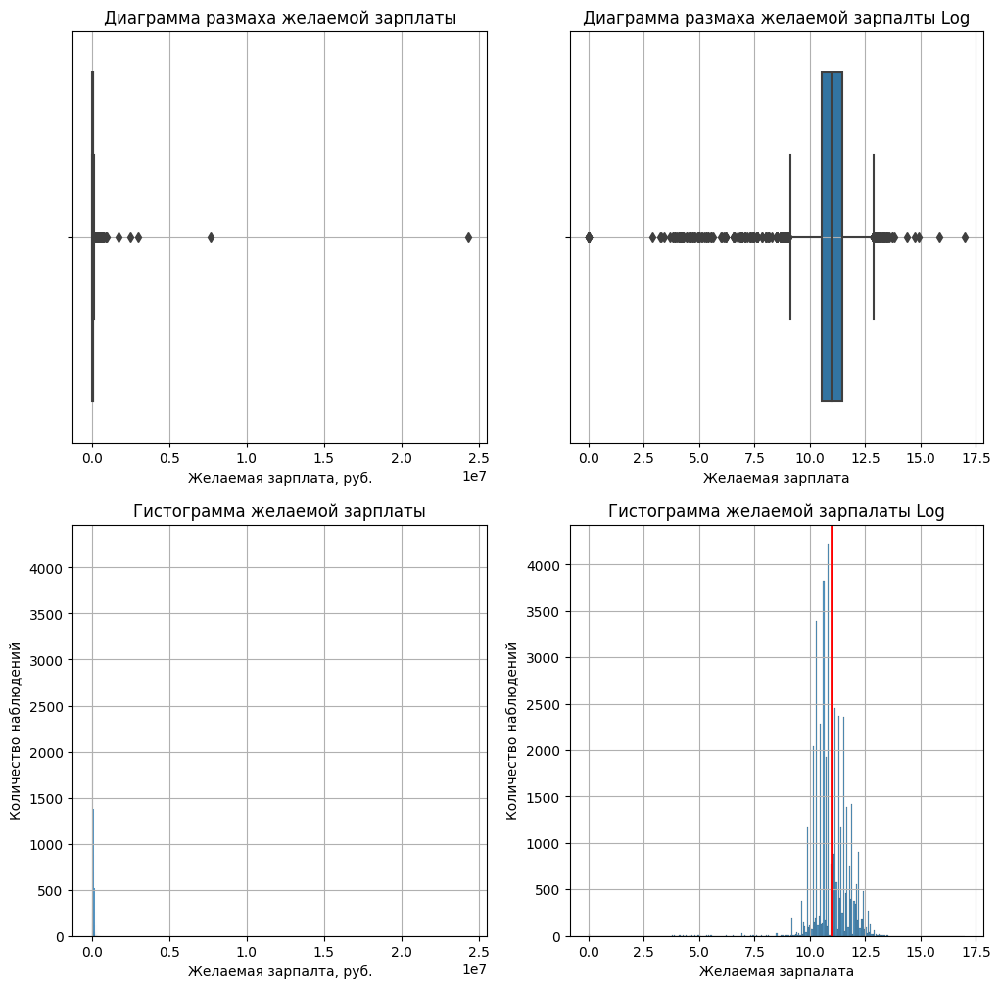

Показатель ассиметрии: -1.64
Модальное значение желаемой зарплаты: 50000.0


In [15]:
# Создаем гистограмму
fig = px.histogram(
    data_frame=hh_df,
    x='ЗП (руб)',   
    marginal='box',
    width=800,
    height=500,
    )

# Настраиваем отображение
fig.update_layout(
    title='Распределение желаемой зарплаты соискателей',
    title_x = 0.5,
    xaxis_title='Желаемая зарплата, руб.',
    yaxis_title='Число наблюдений'    
    )
# Для изменения масштаба отображения можно использовать:
# fig.update_xaxes(range = [0,100000])
fig.show()

# Создаем гистограмму для пролагорифмированного распределния
fig = px.histogram(
    data_frame=hh_df,
    x=np.log(hh_df['ЗП (руб)']),   
    marginal='box',
    width=800,
    height=500,
    )
# Строим линию среднего значения для определения ассиметрии распределения
fig.add_shape(
    type='line',
    line_color='red',
    line_width=3,
    opacity=1,
    line_dash='solid',
    x0=np.log(hh_df['ЗП (руб)']).mean(),
    x1=np.log(hh_df['ЗП (руб)']).mean(),
    xref='x',
    y0=0,
    y1=4500,
    yref='y'
    )

# Настраиваем отображение
fig.update_layout(
    title='Распределение желаемой зарплаты соискателей Log',
    title_x = 0.5,
    xaxis_title='Желаемая зарплата',
    yaxis_title='Число наблюдений'
    )

fig.show()

#Построение графиков в seaborn для корректного отображения на GitHub
# Создаем диаграмму размаха
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
bx = sns.boxplot(
    data=hh_df,
    x='ЗП (руб)',   
    orient='h',
    ax=axes[0][0]
    )

# Повышаем информативность
bx.set_title('Диаграмма размаха желаемой зарплаты')
bx.set_xlabel('Желаемая зарплата, руб.')
bx.grid()

# Создаем гистограмму 
hist = sns.histplot(
    data=hh_df,
    x='ЗП (руб)',
    ax=axes[1][0],
    )

# Повышаем информативность
hist.set_title('Гистограмма желаемой зарплаты')
hist.set_xlabel('Желаемая зарпалта, руб.') 
hist.set_ylabel('Количество наблюдений')
hist.grid()
# Для изменения масштаба отображения можно использовать:
# hist.set_xlim(0, 100000)

# Создаем диаграмму размаха для пролагорифмированного распределения
box = sns.boxplot(
    data=hh_df,
    x=np.log(hh_df['ЗП (руб)']),   
    orient='h',
    ax=axes[0][1]
    )

# Повышаем информативность
box.set_title('Диаграмма размаха желаемой зарпалты Log')
box.set_xlabel('Желаемая зарплата')
box.grid()

# Создаем гистограмму для пролагорифмированного распределения
hist = sns.histplot(
    data=hh_df, 
    x=np.log(hh_df['ЗП (руб)']),
    ax=axes[1][1])
# Строим линию среднего значения для определения ассиметрии распределения
hist.axvline(np.log(hh_df['ЗП (руб)']).mean(), color='r', lw='2')

# Повышаем информативность
hist.set_title('Гистограмма желаемой зарпалаты Log')
hist.set_xlabel('Желаемая зарпалата') 
hist.set_ylabel('Количество наблюдений')
hist.grid()
plt.show()

# Вычислим численный показатель ассиметрии рапределения
print('Показатель ассиметрии:', round(np.log(hh_df['ЗП (руб)']).skew(), 2))
# Вычислим точное модальное значение, на гистограмме оно находится 
# в интервале от 47,5 до 52,49 тысяч
print('Модальное значение желаемой зарплаты:', hh_df['ЗП (руб)'].mode()[0])

***Выводы по графику***

Примерный разброс желаемой заработной платы большинства соискателей находится в пределах от 25000 до 100000 руб. Модальное значение соответствует 50000 руб. Предельные значения признака находятся в интервале от 1 рубля до 24 с лишним миллионов рублей. На графике присутствуют аномальные значения с большой долей вероятности к ним можно отнести значения выше миллиона рублей. Кроме того на диаграмме размаха прологарифмированного распределения можно заметить значение близкое к нулю, которое тоже можно отнести к аномалии (скорее всего соискатель опечатался). Нечитаемость графиков (на гистограмме практически ничего не видно, а диаграмма размаха имеет сплюснутый вид) свидетельствует о наличии значений сильно отличающихся от основной массы.

Задание 4.3       
Определите по графику, сколько соискателей требуют заработную плату выше 1 миллиона рублей.

На диаграмме размаха видно 5  наблюдений больше 1 миллиона рублей. 

Интерактивный график в формате HTML можно посмотреть [тут](https://htmlpreview.github.io/?https://github.com/DmitVasilev/Project_1-resume-analysis-on-HeadHunter/blob/master/image/3_1.html) и [тут](https://htmlpreview.github.io/?https://github.com/DmitVasilev/Project_1-resume-analysis-on-HeadHunter/blob/master/image/3_2.html).

### 4. Постройте диаграмму, которая показывает зависимость **медианной** желаемой заработной платы (**"ЗП (руб)"**) от уровня образования (**"Образование"**). 
Используйте для диаграммы данные о резюме, где желаемая заработная плата меньше 1 млн рублей.
*Сделайте выводы по представленной диаграмме: для каких уровней образования наблюдаются наибольшие и наименьшие уровни желаемой заработной платы? Как вы считаете, важен ли признак уровня образования при прогнозировании заработной платы?*

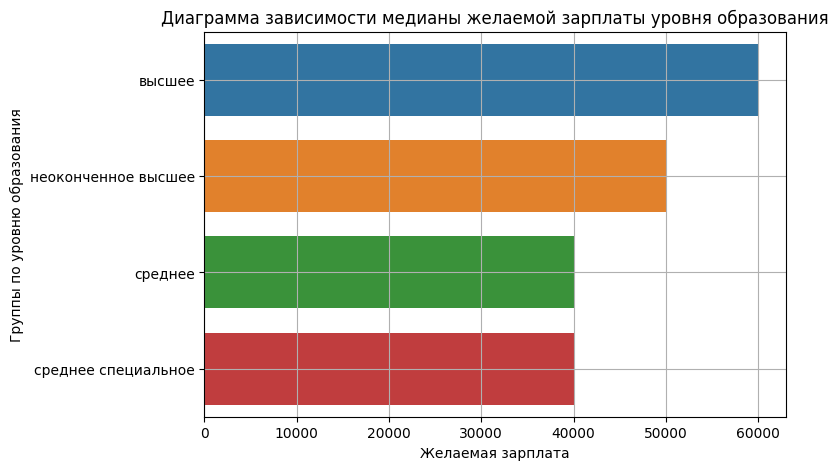

In [16]:
# Фильтруем данные по критерию величины заработной платы меньше миллиона рублей 
# и группируем по признаку образования
mask = (hh_df['ЗП (руб)'] < 1000000)
data = hh_df[mask].groupby('Образование', as_index=False)['ЗП (руб)'].median()

# Строим столбчатую диаграмму
fig = px.bar(
    data_frame=data,
    height=500,
    width=840,
    x='ЗП (руб)',
    y='Образование',
    color='Образование'    
    )

# Настраиваем отображение
fig.update_layout(
    title='Диаграмма зависимости медианы желаемой зарплаты уровня образования',
    title_x = 0.5,
    xaxis_title='Желаемая зарплата',
    yaxis_title='Группы по уровню образования',
    legend=dict(title='Уровень образования')
    )

fig.show()

# Строим график в Seaborn для отображения на GitHub
# Строим столбчатую диаграмму
fig = plt.figure(figsize=(7.5, 5))
bar = sns.barplot(
    data,
    x='ЗП (руб)',
    y='Образование',
    width=-0.75     
    )

# Повышаем информативность
bar.set_title('Диаграмма зависимости медианы желаемой зарплаты уровня образования')
bar.set_xlabel('Желаемая зарплата')
bar.set_ylabel('Группы по уровню образования')
bar.grid()

plt.show()

***Выводы по графику***    
Сделайте выводы по представленной диаграмме: для каких уровней образования наблюдаются наибольшие и наименьшие уровни желаемой заработной платы? Как вы считаете, важен ли признак уровня образования при прогнозировании заработной платы?*

Наибольшее значение наблюдается для соискателей с высшим образованием. В группе со средним и средним специальным образованием наблюдается минимальное медианное значение. На диаграмме видно, что с ростом уровня образования растет и медианное значение ожидаемой соискателем зарплаты. Можно сделать вывод о значимости данного признака при прогнозировании уровня ожидаемой заработной платы.

Задание 4.4       
Какая категория образования оплачивается выше всех по медианному показателю?

Выше всех медианное значение ожидаемой заработной платы у соискателей с высшим образованием.

Интерактивный график в формате HTML можно посмотреть [тут](https://htmlpreview.github.io/?https://github.com/DmitVasilev/Project_1-resume-analysis-on-HeadHunter/blob/master/image/4.html).

### 5. Постройте диаграмму, которая показывает распределение желаемой заработной платы (**"ЗП (руб)"**) в зависимости от города (**"Город"**). 
Используйте для диаграммы данные о резюме, где желанная заработная плата меньше 1 млн рублей.
*Сделайте выводы по полученной диаграмме: как соотносятся медианные уровни желаемой заработной платы и их размах в городах? Как вы считаете, важен ли признак города при прогнозировании заработной платы?*

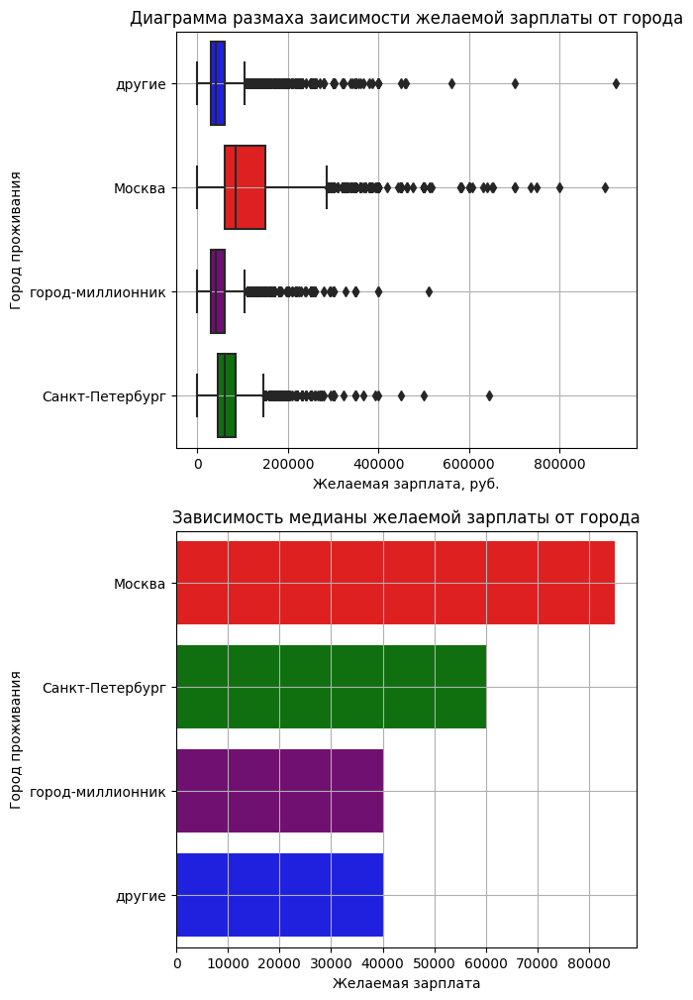

In [17]:
# Группируем отфильтрованные данные по признаку "город"
mask = (hh_df['ЗП (руб)'] < 1000000)
data = hh_df[mask]
bar_data = hh_df[mask].groupby('Город', as_index=False) ['ЗП (руб)'].median()

# Строим диаграмму размаха зависимости желаемой зарплаты от города проживания
fig = px.box(
    data_frame=data,
    x='ЗП (руб)',
    y='Город',
    color='Город',
    width=840,
    height=500,
    color_discrete_map={
        'другие':'blue',
        'Москва':'red',
        'город-миллионник':'purple',
        'Санкт-Петербург':'green'
        }
    )

# Настраиваем отображение
fig.update_layout(
    title='Диаграмма размаха заисимости желаемой зарплаты от города',
    title_x = 0.5,
    xaxis_title='Желаемая зарплата',
    yaxis_title='Город проживания'
    )

fig.show()

# Строим столбчатую диаграмму
fig = px.bar(
    bar_data,
    x='ЗП (руб)',
    y='Город',
    height=500,
    width=840,
    color='Город',
    labels={'ЗП (руб)':'Медиана желаемой зарплаты', 'Город':'Город проживания'},        
    color_discrete_map={
        'другие':'blue',
        'Москва':'red',
        'город-миллионник':'purple',
        'Санкт-Петербург':'green'
        }
    )

# Настраиваем отображение
fig.update_layout(
    legend=dict(title='Статус активного клиента'),
    title='Зависимость медианы желаемой зарплаты от города',
    title_x = 0.5     
    )

fig.show()

#Построение графиков в seaborn для корректного отображения на GitHub
# Создаем диаграмму размаха
fig, axes = plt.subplots(2, 1, figsize=(6, 12))
box = sns.boxplot(
    data,
    x='ЗП (руб)',
    y='Город',   
    orient='h',
    ax=axes[0],
    palette=['blue', 'red', 'purple','green']
    )

# Повышаем информативность
box.set_title('Диаграмма размаха заисимости желаемой зарплаты от города')
box.set_xlabel('Желаемая зарплата, руб.')
box.set_ylabel('Город проживания')
box.grid()

# Строим столбчатую диаграмму

bar = sns.barplot(
    bar_data,
    x='ЗП (руб)',
    y='Город',    
    ax=axes[1],
    palette=['red', 'green', 'purple', 'blue']     
    )

# Повышаем информативность
bar.set_title('Зависимость медианы желаемой зарплаты от города')
bar.set_xlabel('Желаемая зарплата')
bar.set_ylabel('Город проживания')
bar.grid()

plt.show()

***Выводы по графику***     

Для Москвы медианное значение желаемой зарплаты составляет 85 тысяч рублей, размах от 1 рубля до 285 тысяч рублей.
Для Санкт-Петербурга значение желаемой зарплаты ниже чем в Москве - 60 тысяч рублей, размах от 1 рубля до 145 тысяч рублей.
Для городов-миллионников и городов из категории "другие" медианное значение желаемой зарплаты 40 тысяч рублей, а размах от 1 рубля до 105 тысяч рублей.
Во всех категориях нижняя граница размаха составляет 1 рубль это указывает на то, что опечатки при заполнении анкет встречаются регулярно. Медиана и размах ожидаемой зарплаты  зависит от признака города и снижается по мере убывания населения города. Совпадение значений в гордах-миллионниках и городах из категории "другие" скорее всего связано с их количеством (соискателей из городов категории "другие" должно быть значительно больше, а аппетиты соискателей из городов-миллионников до столичных не дотягивают, хотя выбросы и встречаются). Признак города важен при прогнозировании зарпалаты.

Задание 4.5     
В каком городе (категории городов) зафиксирован наибольший показатель желаемой заработной платы (~924 тысячи рублей)?

Наибольший показатель желаемой заработной платы зафиксирован в городе из категории "другие".

Интерактивный график в формате HTML можно посмотреть [тут](https://htmlpreview.github.io/?https://github.com/DmitVasilev/Project_1-resume-analysis-on-HeadHunter/blob/master/image/5_1.html) и [тут](https://htmlpreview.github.io/?https://github.com/DmitVasilev/Project_1-resume-analysis-on-HeadHunter/blob/master/image/5_2.html).



### 6. Постройте **многоуровневую столбчатую диаграмму**, которая показывает зависимость медианной заработной платы (**"ЗП (руб)"**) от признаков **"Готовность к переезду"** и **"Готовность к командировкам"**. 
Проанализируйте график, сравнив уровень заработной платы в категориях.

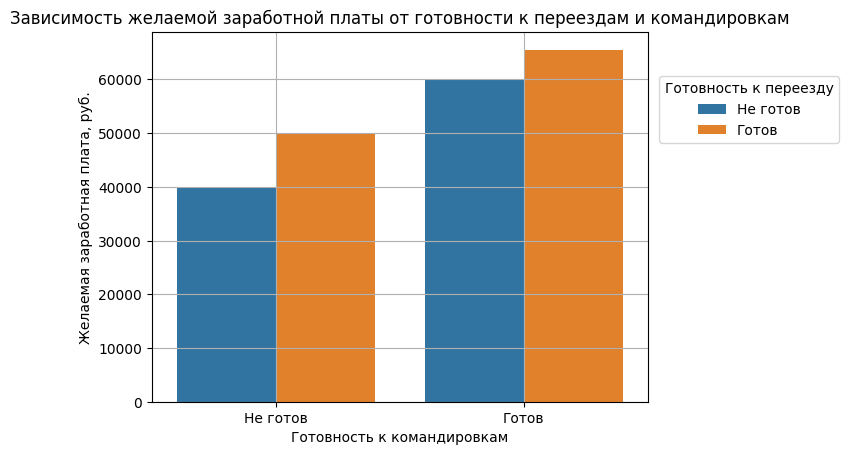

In [18]:
# Группируем отфильтрованные данные по признакам готовности к переезду и командировкам 
mask = (hh_df['ЗП (руб)'] < 1000000)
data = hh_df[mask].groupby(['Готовность к переезду', 'Готовность к командировкам'], as_index=False) ['ЗП (руб)'].median()

# Строим столбчатую диаграмму
fig = px.bar(
    data,
    x='Готовность к командировкам',
    y='ЗП (руб)',
    height=500,
    width=1000,
    color="Готовность к переезду",
    barmode='group',
    labels={'ЗП (руб)':'Желаемая заработная плата, руб.'},
    text=['Не готов', 'Только командировки', 'Только переезд', 'Готов ко всему']
    )

# Повышаем информативность
fig.update_xaxes(
    ticktext=["Не готов", "Готов"],
    tickvals=[False, True]
    )
fig.update_layout(  
    title='Зависимость желаемой заработной платы от готовности к переездам и командировкам',
    title_x = 0.5
    )

# Меняем подписи в легенде
newnames = {'False':"Не готов", 'True':"Готов"}
fig.for_each_trace(lambda t: t.update(name = newnames[t.name],
                                      legendgroup = newnames[t.name],
                                      hovertemplate = t.hovertemplate.replace(t.name, newnames[t.name])
                                     )
                  )
fig.show()

#Построение графиков в seaborn для корректного отображения на GitHub
# Строим столбчатую диаграмму

bar = sns.barplot(
    data,
    x='Готовность к командировкам',
    y='ЗП (руб)',
    hue='Готовность к переезду',
    )

# Повышаем информативность
bar.set_title('Зависимость желаемой заработной платы от готовности к переездам и командировкам')
bar.set_xlabel('Готовность к командировкам')
bar.set_ylabel('Желаемая заработная плата, руб.')
bar.grid()
bar.set(xticklabels=["Не готов", "Готов"])

# Настраиваем легенду
handles, lables= bar.get_legend_handles_labels()
lables = ["Не готов", "Готов"]
bar.legend(handles, lables, title='Готовность к переезду', loc='upper right', bbox_to_anchor=(1.4, 0.9))

plt.show()

***Выводы по графику***     
Максимальная медиана ожидемой зарплаты в категории соискателей готовых к командировкам и переезду. Далее по убыванию значения идут категории соискателей готовые только к командировкам, готовые только к перезду, не готовые к командировкам и переездам. С повышением мобильности растет и уровень ожидаемой зарплаты. Готовность к командировкам ценится выше готовности к перезду скорее всего потому, что командировки подразумевают большую профессиональную ответственность и самостоятельность соискателя. 


Задание 4.6    
Чему равна желаемая медианная заработная плата соискателей, готовых и к переезду, и к командировкам? Ответ приведите в тысячах, округлив до целого (например, 45).

Желаемая медианная заработная плата соискателей, готовых и к переезду, и к командировкам составляет 66 тысяч рублей. 

Интерактивный график в формате HTML можно посмотреть [тут](https://htmlpreview.github.io/?https://github.com/DmitVasilev/Project_1-resume-analysis-on-HeadHunter/blob/master/image/6.html).


### 7. Постройте сводную таблицу, иллюстрирующую зависимость **медианной** желаемой заработной платы от возраста (**"Возраст"**) и образования (**"Образование"**). 
На полученной сводной таблице постройте **тепловую карту**. Проанализируйте тепловую карту, сравнив показатели внутри групп.

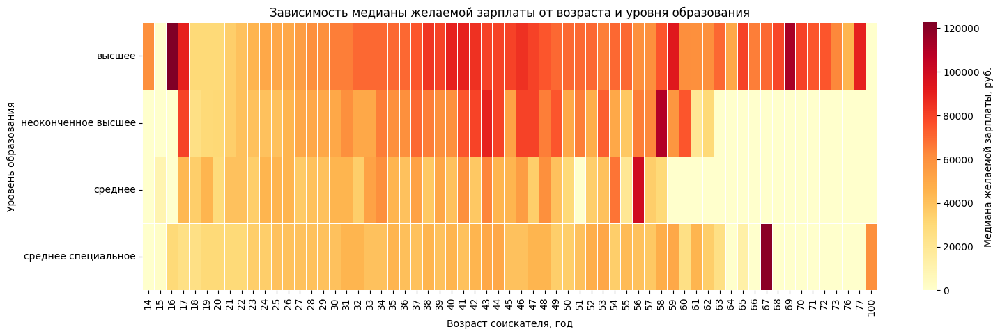

In [19]:
mask = (hh_df['ЗП (руб)'] < 1000000)
data = hh_df.pivot_table(values='ЗП (руб)', index='Образование', columns='Возраст', aggfunc='median', fill_value=0)

# Строим тепловую карту
fig = px.imshow(
    data,
    color_continuous_scale='YlOrRd',
    height=500,
    width=1400
    )

# Настраиваем отображение
fig.update_layout(
    title='Зависимость медианы желаемой зарплаты от возраста и уровня образования',
    title_x = 0.5,
    xaxis_title='Возраст соискателя, год',
    yaxis_title='Уровень образования',
    coloraxis_colorbar=dict(ticks='outside', ticksuffix=' руб.')
    )

fig.show()

#Построение графиков в seaborn для корректного отображения на GitHub
# Строим тепловую карту
fig = plt.figure(figsize=(17, 5))
fig = sns.heatmap(
    data,
    cmap='YlOrRd',
    fmt="d",
    linewidths=.5,
    cbar_kws={'label': 'Медиана желаемой зарплаты, руб.'}
    )

# Повышаем информативность
fig.set_title('Зависимость медианы желаемой зарплаты от возраста и уровня образования')
fig.set_xlabel('Возраст соискателя, год')
fig.set_ylabel('Уровень образования')

plt.show()

***Выводы по графику***

* Для уровня образований "высшее" наблюдается наибольший рост медианы ожидаемой зарплаты. Равномерный рост продолжается до 41 года, далее с увеличением возраста плавно снижается и ожидаемая зарплата. Однако, начиная с 58 лет появлется сильная неравномерность медианного значения ожидаемой зарплаты. Скорее всего это связано с тем, что часть соискателей имеет высокую квалификацию, а часть ищет более спокойную работу или график с неполной занятостью, чтобы иметь больше времени, например на присмотр за внуками. Данный уровень образования представлен почти во всех возрстных группах группа является наиболее распространенной среди всех. Имеются соискатели с высшим образованием, достаточно высоким значением медианы ожидаемой зарпалаты и возрастом младше 18 лет. Скорее всего это ошибки соискателей при заполнении анкеты.          
* Для уровня образования "неоконченное высшее" наблюдается рост медианы ожидаемой зарплаты до 43 лет затем усиливается неравномерность этого показателя. Скорее всего это вызвано уменьшением числа соискателей имеющих неоконченное высшее образование с увеличением возраста. Аномальные значения для 17 лет скорее всего также вызвано малым количеством соискателей с завышенными требованиями/ошибками заполнения.                
* Для среднего уровня образования наблюдается умеренный рост неравномерности медианы ожидаемой зарплаты с возрастом. Имеются соискатели в возрастной группе младше 17 лет возможно эстерном закончившие среднюю школу. С увеличением возраста появляются выделяющиеся выбросы для 54 и 56 лет. Вероятно это связано с малым количеством соискателей имеющих уникальные навыки/опыт работы. Данная группа имеет предельный возраст в 58 лет, возможно это связано с тем, что люди старшего поколения со средним урвнем образования не пользуются интернетом для поиска работы.         
* Для уровня среднего спечиального образования также характерен плавный рост медианы ожидаемой зарплаты и увеличение неравномерности с возрастом. Имеются аномальные значения для 67 и 100 лет. Для 67 лет это скорее всего связано с высокой оценкой соискателями своей квалификации и их малым количеством. Что касается группы 100 лет - это вероятно ошибочное значение.

Задание 4.7      
Для какой категории образования наблюдается самый быстрый карьерный рост (то есть интенсивность роста заработной платы наибольшая)?

Самый быстрый карьерный рост наблюдается у соискателей с высшим образованием 

Интерактивный график в формате HTML можно посмотреть [тут](https://htmlpreview.github.io/?https://github.com/DmitVasilev/Project_1-resume-analysis-on-HeadHunter/blob/master/image/7.html).

### 8. Постройте **диаграмму рассеяния**, показывающую зависимость опыта работы (**"Опыт работы (месяц)"**) от возраста (**"Возраст"**).
 Опыт работы переведите из месяцев в года, чтобы признаки были в едином масштабе. Постройте на графике дополнительно прямую, проходящую через точки (0, 0) и (100, 100). Данная прямая соответствует значениям, когда опыт работы равен возрасту человека. Точки, лежащие на этой прямой и выше нее - аномалии в наших данных (опыт работы больше либо равен возрасту соискателя)

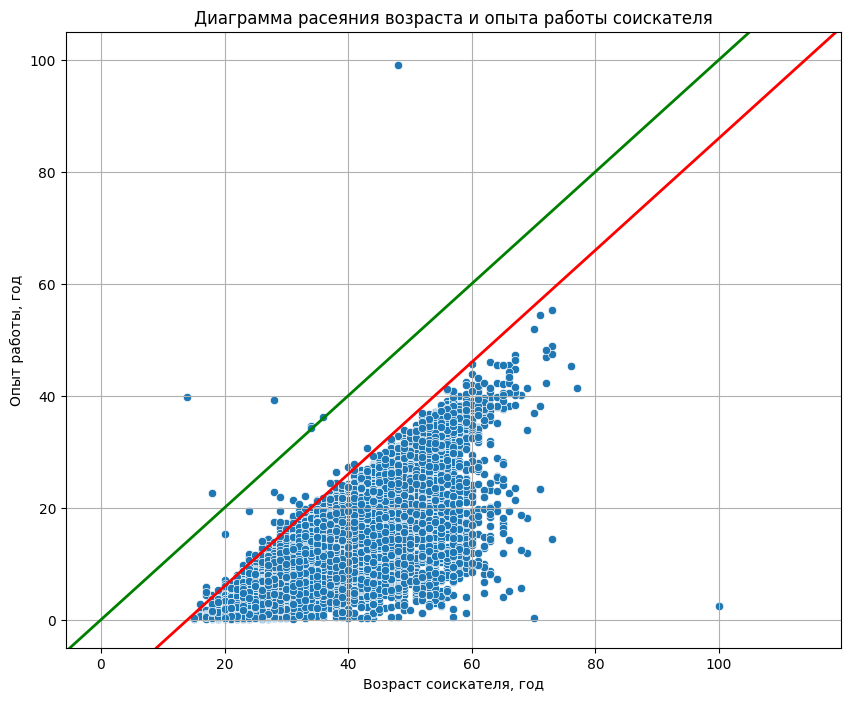

Строго выше построенной прямой лежит 7 точек


In [20]:
# Строим диграмму рассеяния
fig = px.scatter(
    hh_df,
    y=round(hh_df['Опыт работы (месяц)'] / 12, 2),
    x='Возраст'
    )

# Добавляем линию по координатам (0, 0) и (100, 100)
fig.add_scatter(
    x=[0,100], 
    y=[0,100], 
    line_color="green",
    showlegend=False
    )
# Добавляем линию по координатам (14, 0) и (114, 100)
fig.add_scatter(
    x=[14,114], 
    y=[0,100], 
    line_color="red",
    showlegend=False
    )

# Настраиваем отображение
fig.update_layout(
    title='Диаграмма расеяния возраста и опыта работы соискателя',
    title_x = 0.5,
    xaxis_title='Возраст соискателя, год',
    yaxis_title='Опыт работы, год'
    )

fig.show()

#Построение графиков в seaborn для корректного отображения на GitHub
# Строим диаграмму рассеяния 
fig = plt.figure(figsize=(10, 8))
scatter = sns.scatterplot(
    hh_df,
    x='Возраст',
    y=round(hh_df['Опыт работы (месяц)'] / 12, 2),
    )

# Добавляем линию по координатам (0, 0) и (100, 100)
scatter.axline(
    xy1=[0,0], 
    xy2=[100,100], 
    color='g', 
    lw='2'
    )
# Добавляем линию по координатам (14, 0) и (114, 100)
scatter.axline(
    xy1=[14,0], 
    xy2=[114,100], 
    color='r', 
    lw='2'
    )

# Повышаем информативность
scatter.set_title('Диаграмма расеяния возраста и опыта работы соискателя')
scatter.set_xlabel('Возраст соискателя, год')
scatter.set_ylabel('Опыт работы, год')
scatter.grid()
plt.show()

# Определяем количество точек выше зеленой прямой
mask = (hh_df['Опыт работы (месяц)'] / 12) > hh_df['Возраст']
print(f'Строго выше построенной прямой лежит {hh_df[mask].shape[0]} точек')

***Выводы по графику***     
На диаграмме видно 7 аномальных значений точки выше линии обозначающий равенство опыта работы и возраста - соискатели указали опыт работы превышающий их возраст. К аномальному также можно отнести единственного соскателя возрастом 100 лет и маленьким опытом работы. Также присутствуют большое количество соискателей во всех возрастных группах (особенно до 58 лет) с малым опытом работы. Возможно причина в отсутствии оффициального трудоустройства на предыдущих местах работы, или соискатели решившие кардинально сменить род деятельности и поэтому не считающие важным предыдущий опыт работы. Кроме того можно обратить внимание на точки между красной и зеленой линией отделяющиеся от основной массы - это сооискатели начавшие трудовую деятельность до 14 лет. В соответствии с  Федеральным законом от 30.06.2006 N 90-ФЗ трудовые договора могут быть заключены с соискателем до 14 лет для участия в создании и (или) исполнении (экспонировании) произведений в организациях кинематографии, театрах, театральных и концертных организациях, цирках. Вряд ли среди соискателей столько работников искусства, скорее всего это ошибки в заполнении анкеты.

Задание 4.8      
Сколько точек лежат строго выше построенной прямой? Так как точки могут сливаться с прямой, то для ответа на этот вопрос проще всего воспользоваться интерактивной визуализацией либо получить таблицу с наблюдениями, лежащими выше прямой с помощью фильтрации.

Строго выше построенной прямой лежит 7 точек.

Интерактивный график в формате HTML можно посмотреть [тут](https://htmlpreview.github.io/?https://github.com/DmitVasilev/Project_1-resume-analysis-on-HeadHunter/blob/master/image/8.html).

### Дополнительные баллы

Для получения 2 дополнительных баллов по разведывательному анализу постройте еще два любых содержательных графика или диаграммы, которые помогут проиллюстрировать влияние признаков/взаимосвязь между признаками/распределения признаков. Приведите выводы по ним. Желательно, чтобы в анализе участвовали признаки, которые мы создавали ранее в разделе "Преобразование данных".


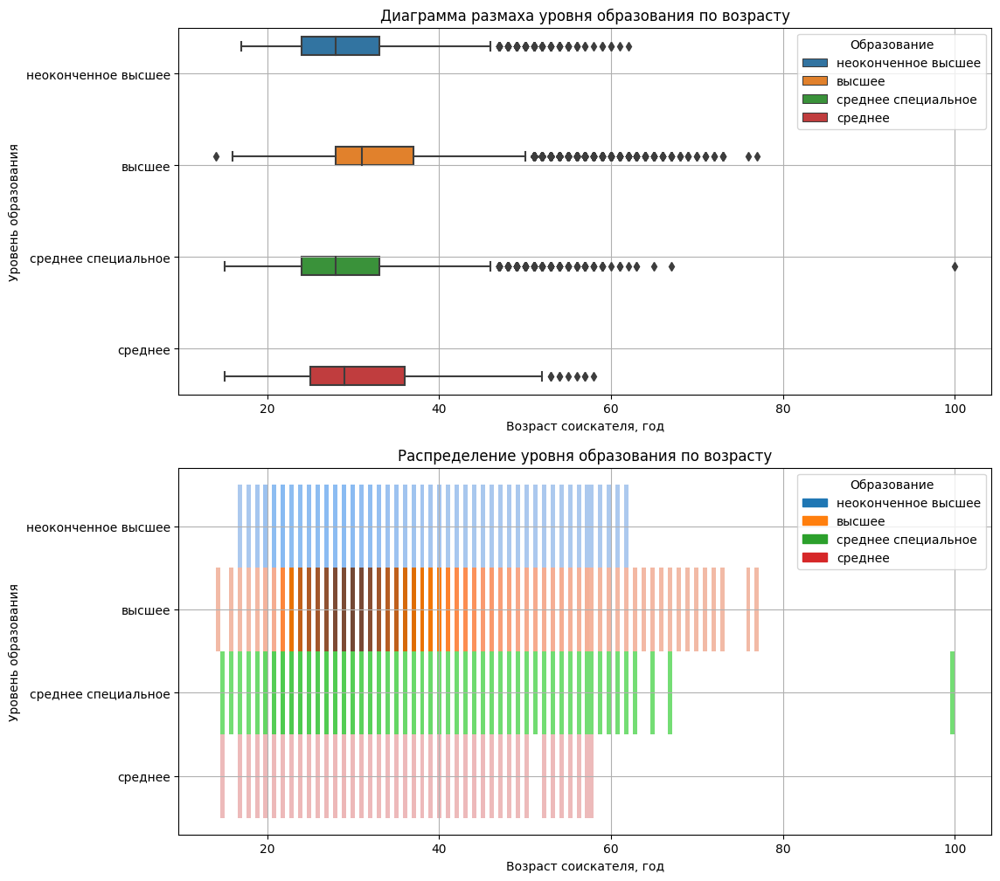

In [21]:
# Строим столбчатую диаграмму распределения уровня образования по возрасту
fig = px.histogram(
    hh_df,
    x='Возраст',
    barmode='group',
    height=500,
    width=1000,
    color='Образование'
    )

fig.update_layout(  
    title='Распределение уровня образования по возрасту',
    xaxis_title='Возраст соискателя, год',
    title_x = 0.5,
    yaxis_title='Количество наблюдений'
    )
 
fig.show()

# Строим диаграмму размаха 
fig = px.box(
    hh_df,
    x='Возраст',
    y='Образование',
    color='Образование',
    width=840,
    height=500,
    )

# Настраиваем отображение
fig.update_layout(
    title='Диаграмма размаха уровня образования по возрасту',
    title_x = 0.5,
    xaxis_title='Возраст соискателя, год',
    yaxis_title='Уровень образования'
    )

fig.show()

#Построение графиков в seaborn для корректного отображения на GitHub
# Создаем диаграмму размаха
fig, axes = plt.subplots(2, 1, figsize=(12, 12))
box = sns.boxplot(
    data=hh_df,
    x='Возраст',
    y='Образование',
    hue='Образование',    
    orient='h',
    ax=axes[0]
    )

# Повышаем информативность
box.set_title('Диаграмма размаха уровня образования по возрасту')
box.set_xlabel('Возраст соискателя, год')
box.set_ylabel('Уровень образования')
box.grid()

# Создаем гистограмму 
hist = sns.histplot(
    data=hh_df,
    x='Возраст',
    y='Образование',
    hue='Образование', 
    ax=axes[1]
    )

# Повышаем информативность
hist.set_title('Распределение уровня образования по возрасту')
hist.set_xlabel('Возраст соискателя, год') 
hist.set_ylabel('Уровень образования')
hist.grid()

plt.show()

***Выводы по дополнительному графику №1***       
Распределение похоже на логнормальное. Большинство имеют высшее образование далее в порядке убывания численности идут соискатели со средним специальным, неоконченным высшим и средним образованием. Возрастной пик соискателей со средним специальным образованием приходится на 24 года (примерно 4 года после окончания обучения), для соискателей с высшим образованием - 30 лет(примерно 7 лет после окончания обучения). Можно предположить, что так как соискатели с высшим образованием в большинстве начинают искать работу позже и иммеют больший опыт работы, относительно группы со средним специальным образованием, они ожидают больший уровень зарплаты. Также можно повторно отметить наличие аномальных значений 14 лет для высшего образования и 100 лет для среднего специального. Значительное преобладание одного уровня образования над другими позволяет предположить, что данный признак может оказывать существенное влияние при определении зависимостей между остальными признаками.

Интерактивный график в формате HTML можно посмотреть [тут](https://htmlpreview.github.io/?https://github.com/DmitVasilev/Project_1-resume-analysis-on-HeadHunter/blob/master/image/9_1.html) и [тут](https://htmlpreview.github.io/?https://github.com/DmitVasilev/Project_1-resume-analysis-on-HeadHunter/blob/master/image/9_2.html).

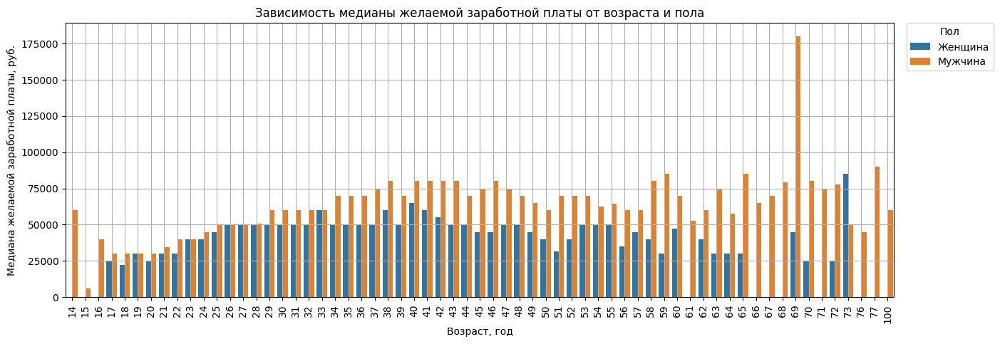

In [22]:
# Группируем данные по признакам пола и возраста
mask = (hh_df['ЗП (руб)'] < 300000)
data_df = (hh_df[mask])
data = hh_df[mask].groupby(['Пол', 'Возраст'], as_index=False) ['ЗП (руб)'].median()

# Строим столбчатую диаграмму
fig = px.bar(
    data,
    x='Возраст',
    y='ЗП (руб)',
    height=500,
    width=1000,
    color='Пол',
    barmode='group',
    labels={'ЗП (руб)':'Медиана желаемой заработной платы, руб.'}
    )

# Повышаем информативность
fig.update_layout(  
    title='Зависимость медианы желаемой заработной платы от возраста и пола',
    xaxis_title='Медиана желаемой заработной платы, руб.',
    title_x = 0.5,
    yaxis_title='Возраст, год'
    )

# Меняем подписи в легенде
newnames = {'Ж':"Женщина", 'М':"Мужчина"}
fig.for_each_trace(lambda t: t.update(name = newnames[t.name],
                                      legendgroup = newnames[t.name],
                                      hovertemplate = t.hovertemplate.replace(t.name, newnames[t.name])
                                     )
                  )
 
fig.show()

#Построение графиков в seaborn для корректного отображения на GitHub
# Строим столбчатую диаграмму
fig = plt.figure(figsize=(15, 5))
bar = sns.barplot(
    data,
    x='Возраст',
    y='ЗП (руб)',
    hue='Пол'    
    )

# Повышаем информативность
bar.set_title('Зависимость медианы желаемой заработной платы от возраста и пола')
bar.set_xlabel('Возраст, год')
bar.set_ylabel('Медиана желаемой заработной платы, руб.')
bar.grid()
plt.xticks(rotation=90)
# Настраиваем легенду
handles, lables= bar.get_legend_handles_labels()
lables = ["Женщина", "Мужчина"]
bar.legend(
    handles,
    lables,
    title='Пол',
    loc='upper right',
    bbox_to_anchor=( 1.12 , 1 ),
    borderaxespad= 0
    )

plt.show()

***Выводы по дополнительному графику №2***       
На диаграмме видно, что до с 23 до 29 лет уровень медианы ожидаемой зарплаты идентичен, далее наблюдается рост показателя для соискателей мужского пола. Меньший показатель среди соискателей женского пола возможно связан с поиском работы после декретного отпуска. Однако имеется и аномальное значение для 73 лет, скорее всего это связано с количеством соискателей разного пола и уровня их образования. В целом можно сказать, что соискатели мужчины после 29 лет ожидают больший уровень зарплаты.

Интерактивный график в формате HTML можно посмотреть [тут](https://htmlpreview.github.io/?https://github.com/DmitVasilev/Project_1-resume-analysis-on-HeadHunter/blob/master/image/10.html).

# Очистка данных

### 1. Начнем с дубликатов в наших данных. Найдите **полные дубликаты** в таблице с резюме и удалите их. 

In [23]:
# Найдем количество полных дубликатов
print(f'Количество обнаруженных полных дубликатов: {hh_df.duplicated().sum()}')
# Удалим полные дубликаты
hh_nodup = hh_df.drop_duplicates(ignore_index=True)
print(f'Количество удаленных полных дубликатов: {hh_df.shape[0] - hh_nodup.shape[0]}')

# Задание 5.1
# Начнём с дубликатов в наших данных. Найдите полные дубликаты в таблице с резюме и удалите их.
# Сколько полных копий удалось найти?

Количество обнаруженных полных дубликатов: 161
Количество удаленных полных дубликатов: 161


### 2. Займемся пропусками. Выведите информацию **о числе пропусков** в столбцах. 

In [24]:
col_nan = hh_nodup.isnull().sum()
col = col_nan[col_nan > 0].sort_values(ascending=False)
print('Пропуски присутствуют в столбцах:')
display(col)

# Задание 5.2
# Займёмся пропусками. Выведите информацию о числе пропусков в столбцах.
# Сколько пропусков в столбце «Опыт работы (месяц)»?
print(f'Число пропусков в столбце "Опыт работы (месяц)": { col["Опыт работы (месяц)"].sum()}')

Пропуски присутствуют в столбцах:


Опыт работы (месяц)                168
Последняя/нынешняя должность         2
Последнее/нынешнее место работы      1
dtype: int64

Число пропусков в столбце "Опыт работы (месяц)": 168


### 3. Итак, у нас есть пропуски в 3ех столбцах: **"Опыт работы (месяц)"**, **"Последнее/нынешнее место работы"**, **"Последняя/нынешняя должность"**. 
Поступим следующим образом: удалите строки, где есть пропуск в столбцах с местом работы и должностью. Пропуски в столбце с опытом работы заполните **медианным** значением.

In [25]:
hh_clear = hh_nodup.dropna(how='any', subset=['Последняя/нынешняя должность', 'Последнее/нынешнее место работы'])
hh_clear = hh_clear.fillna(value={'Опыт работы (месяц)':hh_clear['Опыт работы (месяц)'].median()})

# Проверим количество пропусков
col_nan = hh_clear.isnull().sum()
print(f'Количество пропусков в таблице: {col_nan.sum()}')

# Задание 5.3
# Чему равно результирующее среднее значение в столбце «Опыт работы (месяц)» после заполнения пропусков? Ответ округлите до целых.
print(
    'Результирующее среднее значение в столбце "Опыт работы (месяц)" составляет: ',
    round(hh_clear['Опыт работы (месяц)'].mean())
    )

Количество пропусков в таблице: 0
Результирующее среднее значение в столбце "Опыт работы (месяц)" составляет:  114


### 4. Мы добрались до ликвидации выбросов. 
Сначала очистим данные вручную. Удалите резюме, в которых указана заработная плата либо выше 1 млн. рублей, либо ниже 1 тыс. рублей.

In [26]:
# Отфильтруем данные по заданному условию, извлечем индексы и удалим строки по полученным индексам 
mask = (hh_clear['ЗП (руб)'] > 1e6) | (hh_clear['ЗП (руб)'] < 1e3)
ind = hh_clear[mask].index
hh_clear_anom = hh_clear.drop(index=ind)

# Задание 5.4
# Сколько выбросов вы нашли?
print(f'Количество найденных выбросов: {ind.value_counts().sum()}')

Количество найденных выбросов: 89


### 5. В процессе разведывательного анализа мы обнаружили резюме, в которых **опыт работы в годах превышал возраст соискателя**. 
Найдите такие резюме и удалите их из данных


In [27]:
# Отфильтруем данные по заданному условию, извлечем индексы и удалим строки по полученным индексам 
mask = (hh_clear_anom['Опыт работы (месяц)'] / 12) > hh_clear_anom['Возраст']
ind = hh_clear_anom[mask].index
hh_no_anom = hh_clear_anom.drop(index=ind)

# Задание 5.5
# Сколько выбросов вы нашли?
print(f'Количество найденных выбросов: {ind.value_counts().sum()}')

Количество найденных выбросов: 7


### 6. В результате анализа мы обнаружили потенциальные выбросы в признаке **"Возраст"**. 
Это оказались резюме людей чересчур преклонного возраста для поиска работы. Попробуйте построить распределение признака в **логарифмическом масштабе**. Добавьте к графику линии, отображающие **среднее и границы интервала метода трех сигм**. Напомним, сделать это можно с помощью метода axvline. Например, для построение линии среднего будет иметь вид:

`histplot.axvline(log_age.mean(), color='k', lw=2)`

В какую сторону асимметрично логарифмическое распределение? Напишите об этом в комментарии к графику.
Найдите выбросы с помощью метода z-отклонения и удалите их из данных, используйте логарифмический масштаб. Давайте сделаем послабление на **1 сигму** (возьмите 4 сигмы) в **правую сторону**.

Выведите таблицу с полученными выбросами и оцените, с каким возрастом соискатели попадают под категорию выбросов?

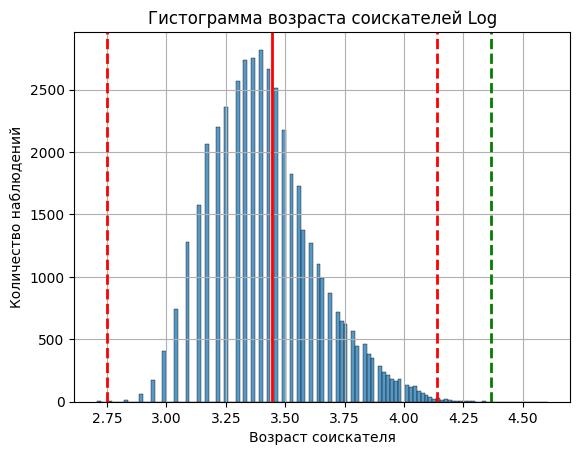

Показатель ассиметрии: 0.45
Число выбросов при границах от -3 до +3 сигм: 112
Число выбросов при границах от -3 до +4 сигм: 3


,Ищет работу на должность:,Последнее/нынешнее место работы,Последняя/нынешняя должность,Обновление резюме,Авто,Образование,Пол,Возраст,Опыт работы (месяц),Город,...,частичная занятость,проектная работа,волонтерство,стажировка,полный день,сменный график,гибкий график,удаленная работа,вахтовый метод,ЗП (руб)
30982,Менеджер по работе с клиентами,"ООО ""ФёрстКэшКомпани""",Менеджер по работе с клиентами,2019-04-06,Не указано,среднее,М,15,2.0,Санкт-Петербург,...,True,False,False,False,False,True,True,True,False,10000.0
32795,Тестировщик игр,OOO ЖМЫХ,Тестировщик ПО,2019-04-09,Не указано,среднее специальное,М,15,3.0,другие,...,False,False,False,False,True,False,False,False,False,2000.0
33499,Frontend-разработчик,Freelance,Frontend-разработчик,2019-04-19,Не указано,среднее специальное,М,100,30.0,Санкт-Петербург,...,True,True,False,True,True,False,True,True,False,60000.0


In [28]:
# Создаем гистограмму для пролагорифмированного распределения возраста соискателей
fig = px.histogram(
    data_frame=hh_no_anom,
    x=np.log(hh_no_anom['Возраст']),   
    width=800,
    height=500,
    )
# Строим линию среднего значения для определения ассиметрии распределегия
fig.add_shape(
    type='line',
    line_color='red',
    line_width=3,
    opacity=1,
    line_dash='solid',
    x0=np.log(hh_no_anom['Возраст']).mean(),
    x1=np.log(hh_no_anom['Возраст']).mean(),
    xref='x',
    y0=0,
    y1=3000,
    yref='y'
    )

# Сторим границы по методу z-отклонения для варианта +3, -3 и +4 сигмы 
fig.add_shape(
    type='line',
    line_color='red',
    line_width=3,
    opacity=1,
    line_dash='dot',
    x0=np.log(hh_no_anom['Возраст']).mean() + 3 * np.log(hh_no_anom['Возраст']).std(),
    x1=np.log(hh_no_anom['Возраст']).mean() + 3 * np.log(hh_no_anom['Возраст']).std(),
    xref='x',
    y0=0,
    y1=3000,
    yref='y'
    )

fig.add_shape(
    type='line',
    line_color='red',
    line_width=3,
    opacity=1,
    line_dash='dot',
    x0=np.log(hh_no_anom['Возраст']).mean() - 3 * np.log(hh_no_anom['Возраст']).std(),
    x1=np.log(hh_no_anom['Возраст']).mean() - 3 * np.log(hh_no_anom['Возраст']).std(),
    xref='x',
    y0=0,
    y1=3000,
    yref='y'
    )

fig.add_shape(
    type='line',
    line_color='green',
    line_width=3,
    opacity=1,
    line_dash='dot',
    x0=np.log(hh_no_anom['Возраст']).mean() + 4 * np.log(hh_no_anom['Возраст']).std(),
    x1=np.log(hh_no_anom['Возраст']).mean() + 4 * np.log(hh_no_anom['Возраст']).std(),
    xref='x',
    y0=0,
    y1=3000,
    yref='y'
    )

# Настраиваем отображение
fig.update_layout(
    title='Распределение возраста соискателей Log',
    title_x = 0.5,
    xaxis_title='Возраст соискателей',
    yaxis_title='Число наблюдений'
    )
    
fig.show()

#Построение графиков в seaborn для корректного отображения на GitHub
# Создаем гистограмму для пролагорифмированного распределения
hist = sns.histplot(
    data=hh_no_anom, 
    x=np.log(hh_no_anom['Возраст']),
    )

# Строим линию среднего значения для определения ассиметрии распределегия
hist.axvline(np.log(hh_no_anom['Возраст']).mean(), color='r', lw='2')

# Сторим границы по методу z-отклонения для варианта +3, -3 и +4 сигмы 
hist.axvline(np.log(hh_no_anom['Возраст']).mean() + 3 * np.log(hh_no_anom['Возраст']).std(), color='r', lw='2', ls='--')
hist.axvline(np.log(hh_no_anom['Возраст']).mean() - 3 * np.log(hh_no_anom['Возраст']).std(), color='r', lw='2', ls='--')
hist.axvline(np.log(hh_no_anom['Возраст']).mean() + 4 * np.log(hh_no_anom['Возраст']).std(), color='g', lw='2', ls='--')

# Повышаем информативность
hist.set_title('Гистограмма возраста соискателей Log')
hist.set_xlabel('Возраст соискателя') 
hist.set_ylabel('Количество наблюдений')
hist.grid()
plt.show()

# Вычислим численный показатель ассиметрии рапределения
print('Показатель ассиметрии:', round(np.log(hh_df['Возраст']).skew(), 2))

# Для нахождения выбросов воспользуемся функцией из модуля по очистке данных
def outliers_z_score_mod(data, feature, log_scale=False, left=3, right=3, shift=0):
    """Функция анализирует полученный DataFrame по целевому признаку по методу z-отклонения и разделяет его на DataFrame
    с очищенными данными и с полученными выбросами. 
    
    Args:
        data (pd.DataFrame):исходный DataFrame
        feature (int, float): целевой признак
        log_scale (bool, optional): применять или нет логарифмический масштаб, по умолчанию - нет
        left (int, optional): применяемое количество стандартных квадратичных отклонений слева, по умолчанию 3
        right (int, optional): применяемое количество стандартных квадратичных отклонений справа, по умолчанию 3
        shift (int): коэффициент смещения, если признак содержит нулевые значения следует установить 1, по умолчанию - 0
        
    Returns:
        pd.DataFrame: возвращает два DataFrame, первый содержит выбросы, второй - очищенные данные
    """
    if log_scale:
        x = np.log(data[feature]+shift)
    else:
        x = data[feature]
    mu = x.mean()
    sigma = x.std()
    lower_bound = mu - left * sigma
    upper_bound = mu + right * sigma
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x > lower_bound) & (x < upper_bound)]
    return outliers, cleaned


# Найдем число выбросов методом z-отклонений для границ +/-3 сигмы         
outliers, cleaned = outliers_z_score_mod(hh_no_anom, 'Возраст', log_scale=True)       
print(f'Число выбросов при границах от -3 до +3 сигм: {outliers.shape[0]}')

# Найдем число выбросов методом z-отклонений для границ +4/-3 сигмы  
outliers, cleaned = outliers_z_score_mod(hh_no_anom, 'Возраст', right=4, log_scale=True)        
print(f'Число выбросов при границах от -3 до +4 сигм: {outliers.shape[0]}')

# Сохраним очищенные данные и выведем таблицу с выбросами
clean_data = cleaned
display(outliers)

***Выводы по графику***
* На графике построенном в логарифмическом масштабе рапределение похоже на нормальное с правой ассиметрией (справа от моды имеется больше наблюдений чем слева). Показатель ассимаетрии As= 0,45 положительный, что подтверждает вывод о правой ассиметрии распределения. Краные пунктирные линии на графике показывают границы по методу z-отклонений, для границ от минус 3 до плюс 3 сигм. При этом видно, что за правой границей имеется много потенциальных выбросов (120). Если привести значения попавшие в выбросы к обычному масштабу - получим, что выбросами считается возраст начиная с 63 лет. Учитывая количество потенциальных выбросов и то, что пенсионный возраст в России 60 - 65 лет вряд ли можно считать эти значения выбросами. Расширив правую границу до 4 сигм (зеленая пунктирная линия) мы уже получим один потенциальный выброс справа.      
* Выведя таблицу с полученными выбросами видим, что к выбросам отнесено 3 значений два по 15 лет и одно 100 лет. В 100 летнего соискателя верится с трудом, скорее всего это опечатка при заполнении анкеты соискателем. А вот два соискателя  возрастом 15 лет вполне могут быть вполне реальными. На это указывает характер искомой работы (тестировщик игр - вполне реально для 15-летнего подростка, как и менеджер по работе с клиентами - вполне подходит для летней подработки) и ожидаемая зарплата. Указанный в графе уровень образования может вызывать сомнение, но скорее всего в анкете просто не было пункта с неоконченным средним или средним специальным образованием и соискатели указали ближайшее подходящее значение. Опыт работы у них тоже правдоподобный (3 и 2 месяца).

Задание 5.6       
Сколько выбросов вы нашли с помощью метода z-отклонений?         
Число выбросов при границах от -3 до +4 сигм: 3

Интерактивный график в формате HTML можно посмотреть [тут](https://htmlpreview.github.io/?https://github.com/DmitVasilev/Project_1-resume-analysis-on-HeadHunter/blob/master/image/11.html).      
[Назад к README.md](https://github.com/DmitVasilev/Project_1-resume-analysis-on-HeadHunter)